## Rover Project Test Notebook
This notebook contains the functions from the lesson and provides the scaffolding you need to test out your mapping methods.  The steps you need to complete in this notebook for the project are the following:

* First just run each of the cells in the notebook, examine the code and the results of each.
* Run the simulator in "Training Mode" and record some data. Note: the simulator may crash if you try to record a large (longer than a few minutes) dataset, but you don't need a ton of data, just some example images to work with.   
* Change the data directory path (2 cells below) to be the directory where you saved data
* Test out the functions provided on your data
* Write new functions (or modify existing ones) to report and map out detections of obstacles and rock samples (yellow rocks)
* Populate the `process_image()` function with the appropriate steps/functions to go from a raw image to a worldmap.
* Run the cell that calls `process_image()` using `moviepy` functions to create video output
* Once you have mapping working, move on to modifying `perception.py` and `decision.py` to allow your rover to navigate and map in autonomous mode!

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

**Run the next cell to get code highlighting in the markdown cells.**

In [87]:
%%HTML
<style> code {background-color : orange !important;} </style>

In [88]:
%matplotlib inline
#%matplotlib qt # Choose %matplotlib qt to plot to an interactive window (note it may show up behind your browser)
# Make some of the relevant imports
import cv2 # OpenCV for perspective transform
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import scipy.misc # For saving images as needed
import glob  # For reading in a list of images from a folder
import imageio
imageio.plugins.ffmpeg.download()


## Quick Look at the Data
There's some example data provided in the `test_dataset` folder.  This basic dataset is enough to get you up and running but if you want to hone your methods more carefully you should record some data of your own to sample various scenarios in the simulator.  

Next, read in and display a random image from the `test_dataset` folder

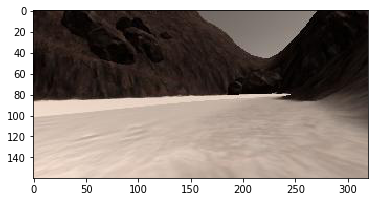

In [89]:
path = '../test_dataset/IMG/*'
img_list = glob.glob(path)
# Grab a random image and display it
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
plt.imshow(image)

## Calibration Data
Read in and display example grid and rock sample calibration images.  You'll use the grid for perspective transform and the rock image for creating a new color selection that identifies these samples of interest. 

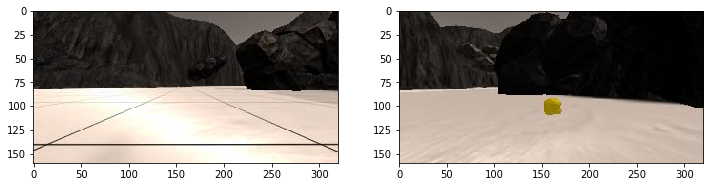

In [90]:
# In the simulator you can toggle on a grid on the ground for calibration
# You can also toggle on the rock samples with the 0 (zero) key.  
# Here's an example of the grid and one of the rocks
example_grid = '../calibration_images/example_grid1.jpg'
example_rock = '../calibration_images/example_rock1.jpg'
grid_img = mpimg.imread(example_grid)
rock_img = mpimg.imread(example_rock)

fig = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(grid_img)
plt.subplot(122)
plt.imshow(rock_img)

## Perspective Transform

Define the perspective transform function from the lesson and test it on an image.

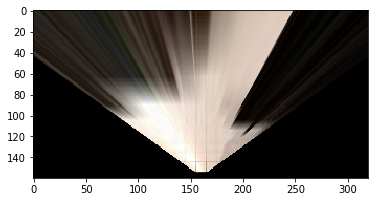

In [91]:
# Define a function to perform a perspective transform
# I've used the example grid image above to choose source points for the
# grid cell in front of the rover (each grid cell is 1 square meter in the sim)
# Define a function to perform a perspective transform
def perspect_transform(img, src, dst):
           
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))# keep same size as input image
    
    return warped


# Define calibration box in source (actual) and destination (desired) coordinates
# These source and destination points are defined to warp the image
# to a grid where each 10x10 pixel square represents 1 square meter
# The destination box will be 2*dst_size on each side
dst_size = 5 
# Set a bottom offset to account for the fact that the bottom of the image 
# is not the position of the rover but a bit in front of it
# this is just a rough guess, feel free to change it!
bottom_offset = 6
source = np.float32([[14, 140], [301 ,140],[200, 96], [118, 96]])
destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                  [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                  ])
warped = perspect_transform(grid_img, source, destination)
plt.imshow(warped)
#scipy.misc.imsave('../output/warped_example.jpg', warped)

## Color Thresholding
Define the color thresholding function from the lesson and apply it to the warped image

**TODO:** Ultimately, you want your map to not just include navigable terrain but also obstacles and the positions of the rock samples you're searching for.  Modify this function or write a new function that returns the pixel locations of obstacles (areas below the threshold) and rock samples (yellow rocks in calibration images), such that you can map these areas into world coordinates as well.  
**Hints and Suggestion:** 
* For obstacles you can just invert your color selection that you used to detect ground pixels, i.e., if you've decided that everything above the threshold is navigable terrain, then everthing below the threshold must be an obstacle!


* For rocks, think about imposing a lower and upper boundary in your color selection to be more specific about choosing colors.  You can investigate the colors of the rocks (the RGB pixel values) in an interactive matplotlib window to get a feel for the appropriate threshold range (keep in mind you may want different ranges for each of R, G and B!).  Feel free to get creative and even bring in functions from other libraries.  Here's an example of [color selection](http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_colorspaces/py_colorspaces.html) using OpenCV.  

* **Beware However:** if you start manipulating images with OpenCV, keep in mind that it defaults to `BGR` instead of `RGB` color space when reading/writing images, so things can get confusing.

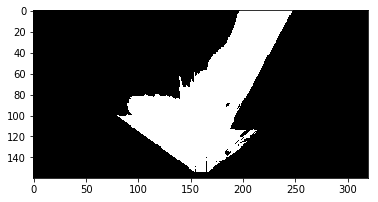

In [92]:
# Identify pixels above the threshold
# Threshold of RGB > 160 does a nice job of identifying ground pixels only
def color_thresh(img, rgb_thresh=(160, 160, 160)):
    # Create an array of zeros same xy size as img, but single channel
    color_select = np.zeros_like(img[:,:,0])
    # Require that each pixel be above all three threshold values in RGB
    # above_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_thresh = (img[:,:,0] > rgb_thresh[0]) \
                & (img[:,:,1] > rgb_thresh[1]) \
                & (img[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1
    color_select[above_thresh] = 1
    # Return the binary image
    return color_select

threshed = color_thresh(warped)
plt.imshow(threshed, cmap='gray')
#scipy.misc.imsave('../output/warped_threshed.jpg', threshed*255)

## Coordinate Transformations
Define the functions used to do coordinate transforms and apply them to an image.

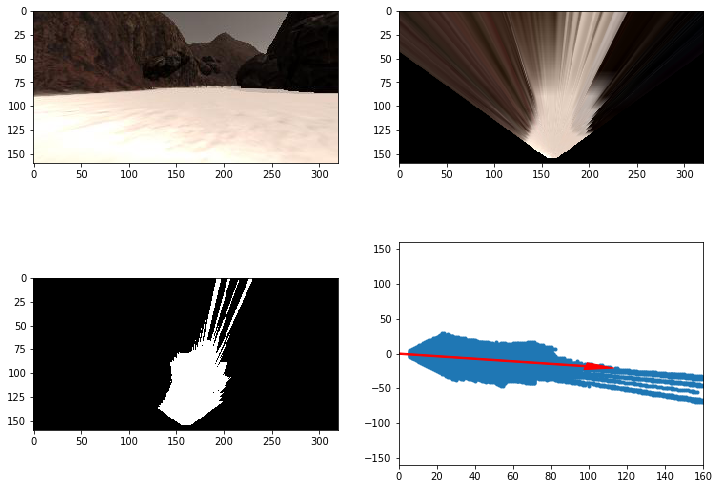

In [136]:
# Define a function to convert from image coords to rover coords
def rover_coords(binary_img):
    # Identify nonzero pixels
    ypos, xpos = binary_img.nonzero()
    # Calculate pixel positions with reference to the rover position being at the 
    # center bottom of the image.  
    x_pixel = -(ypos - binary_img.shape[0]).astype(np.float)
    y_pixel = -(xpos - binary_img.shape[1]/2 ).astype(np.float)
    return x_pixel, y_pixel

# Define a function to convert to radial coords in rover space
def to_polar_coords(x_pixel, y_pixel):
    # Convert (x_pixel, y_pixel) to (distance, angle) 
    # in polar coordinates in rover space
    # Calculate distance to each pixel
    dist = np.sqrt(x_pixel**2 + y_pixel**2)
    # Calculate angle away from vertical for each pixel
    angles = np.arctan2(y_pixel, x_pixel)
    return dist, angles

# Define a function to map rover space pixels to world space
def rotate_pix(xpix, ypix, yaw):
    # Convert yaw to radians
    yaw_rad = yaw * np.pi / 180
    print('yaw_rad =', yaw_rad)
    xpix_rotated = (xpix * np.cos(yaw_rad)) - (ypix * np.sin(yaw_rad))
                            
    ypix_rotated = (xpix * np.sin(yaw_rad)) + (ypix * np.cos(yaw_rad))
    # Return the result  
    return xpix_rotated, ypix_rotated

def translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale): 
    # Apply a scaling and a translation
    xpix_translated = (xpix_rot / scale) + xpos
    ypix_translated = (ypix_rot / scale) + ypos
    # Return the result  
    return xpix_translated, ypix_translated


# Define a function to apply rotation and translation (and clipping)
# Once you define the two functions above this function should work
def pix_to_world(xpix, ypix, xpos, ypos, yaw, world_size, scale):
    # Apply rotation
    xpix_rot, ypix_rot = rotate_pix(xpix, ypix, yaw)
    # Apply translation
    xpix_tran, ypix_tran = translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale)
    # Perform rotation, translation and clipping all at once
    x_pix_world = np.clip(np.int_(xpix_tran), 0, world_size - 1)
    y_pix_world = np.clip(np.int_(ypix_tran), 0, world_size - 1)
    # Return the result
    return x_pix_world, y_pix_world

# Grab another random image
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
warped = perspect_transform(image, source, destination)
threshed = color_thresh(warped)

# Calculate pixel values in rover-centric coords and distance/angle to all pixels
xpix, ypix = rover_coords(threshed)
dist, angles = to_polar_coords(xpix, ypix)
mean_dir = np.mean(angles)

# Do some plotting
fig = plt.figure(figsize=(12,9))
plt.subplot(221)
plt.imshow(image)
plt.subplot(222)
plt.imshow(warped)
plt.subplot(223)
plt.imshow(threshed, cmap='gray')
plt.subplot(224)
plt.plot(xpix, ypix, '.')
plt.ylim(-160, 160)
plt.xlim(0, 160)
arrow_length = 100
x_arrow = arrow_length * np.cos(mean_dir)
y_arrow = arrow_length * np.sin(mean_dir)
plt.arrow(0, 0, x_arrow, y_arrow, color='red', zorder=2, head_width=10, width=2)



## Read in saved data and ground truth map of the world
The next cell is all setup to read your saved data into a `pandas` dataframe.  Here you'll also read in a "ground truth" map of the world, where white pixels (pixel value = 1) represent navigable terrain.  

After that, we'll define a class to store telemetry data and pathnames to images.  When you instantiate this class (`data = Databucket()`) you'll have a global variable called `data` that you can refer to for telemetry and map data within the `process_image()` function in the following cell.  


In [137]:
# Import pandas and read in csv file as a dataframe
import pandas as pd
# Change the path below to your data directory
# If you are in a locale (e.g., Europe) that uses ',' as the decimal separator
# change the '.' to ','
df = pd.read_csv('../test_dataset/robot_log.csv', delimiter=';', decimal='.')
csv_img_list = df["Path"].tolist() # Create list of image pathnames
# Read in ground truth map and create a 3-channel image with it
ground_truth = mpimg.imread('../calibration_images/map_bw.png')
ground_truth_3d = np.dstack((ground_truth*0, ground_truth*255, ground_truth*0)).astype(np.float)

# Creating a class to be the data container
# Will read in saved data from csv file and populate this object
# Worldmap is instantiated as 200 x 200 grids corresponding 
# to a 200m x 200m space (same size as the ground truth map: 200 x 200 pixels)
# This encompasses the full range of output position values in x and y from the sim
class Databucket():
    def __init__(self):
        self.images = csv_img_list  
        self.xpos = df["X_Position"].values
        self.ypos = df["Y_Position"].values
        self.yaw = df["Yaw"].values
        self.count = 0 # This will be a running index
        self.worldmap = np.zeros((200, 200, 3)).astype(np.float)
        self.ground_truth = ground_truth_3d # Ground truth worldmap

# Instantiate a Databucket().. this will be a global variable/object
# that you can refer to in the process_image() function below
data = Databucket()


## Write a function to process stored images

Modify the `process_image()` function below by adding in the perception step processes (functions defined above) to perform image analysis and mapping.  The following cell is all set up to use this `process_image()` function in conjunction with the `moviepy` video processing package to create a video from the images you saved taking data in the simulator.  

In short, you will be passing individual images into `process_image()` and building up an image called `output_image` that will be stored as one frame of video.  You can make a mosaic of the various steps of your analysis process and add text as you like (example provided below).  



To start with, you can simply run the next three cells to see what happens, but then go ahead and modify them such that the output video demonstrates your mapping process.  Feel free to get creative!

In [173]:

# Define a function to pass stored images to
# reading rover position and yaw angle from csv file
# This function will be used by moviepy to create an output video
def process_image(img):
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    # print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    #************ 1) Define source and destination points for perspective transform *******************************************
    
    # Define calibration box in source (actual) and destination (desired) coordinates
    # These source and destination points are defined to warp the image
    # to a grid where each 10x10 pixel square represents 1 square meter
    # The destination box will be 2*dst_size on each side
    dst_size = 5 
    # Set a bottom offset to account for the fact that the bottom of the image 
    # is not the position of the rover but a bit in front of it
    # this is just a rough guess, feel free to change it!
    bottom_offset = 6
    source = np.float32([[14, 140], [301 ,140],[200, 96], [118, 96]])
    destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                      [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                      [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                      [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                      ])
    
    #************ 2) Apply perspective transform ******************************************************************************
    M = cv2.getPerspectiveTransform(source, destination)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))# keep same size as input image
    #Plot warped
    #plt.imshow(warped)
    
    #************ 3) Apply color threshold to identify navigable terrain/obstacles/rock samples *******************************
    
    # terrain_obstacle_rock = color_thresh(warped)
    
    # rgb_thresh for ground & obstacles
    rgb_thresh=(160, 160, 160)
    
    # Create an array of zeros same xy size as img, but single channel
    color_select = np.zeros_like(warped[:,:,0])
    
    # Require that each pixel be above all three threshold values in RGB
    # above_rgb_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_rgb_thresh = (warped[:,:,0] > rgb_thresh[0]) \
                   & (warped[:,:,1] > rgb_thresh[1]) \
                    & (warped[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1 where rgb threshold was exceeded
    color_select[above_rgb_thresh] = 1
    
    #Rock Sample Thresh
    rock_thresh=(100,100,20)
    
    # Create an array of zeros for rocks same xy size as img, but another single channel
    rock_select = np.zeros_like(img[:,:,0])
    
    # Require that each pixel be above the red and green threshhold values
    # and below the blue threshold value
    in_rock_thresh = (warped[:,:,0] > rock_thresh[0]) \
                    & (warped[:,:,1] > rock_thresh[1]) \
                    & (warped[:,:,2] < rock_thresh[2])
            
    
    # Index the array of zeros with the boolean array and set to 2 where rock rgb threshold was exceeded/met
    rock_select[in_rock_thresh] = 2
    
    # Add color_select and rock_select arrays
    terrain_obstacle_rock = color_select + rock_select

    
    #************* 4) Convert thresholded image pixel values to rover-centric coords ******************************************
    
    xpix, ypix = rover_coords(terrain_obstacle_rock)
            
    
    #************* 5) Convert rover-centric pixel values to world coords ******************************************************
    
    # get xpos and ypos for pix_to_world
    #ypos, xpos = terrain_obstacle_rock.nonzero()
    #set xpos and ypos of rover to random coordinates on the world map
    xpos = np.random.random(1)*160 + 20
    ypos = np.random.random(1)*160 + 20
    
    # get yaw for pix_to_world --> Generate a random number between 0 and 360
    rover_yaw = np.random.random(1)*360
    print('rover_yaw =',rover_yaw)
    
    # get world_size for pix_to_world --> Generate an array of zeros of chosen size 200 by 200. Will pass worldmap.shape[0]
    # into the pix_to_world function
    worldmap = np.zeros((200, 200))
    
    # get scale for pix_to_world --> assuming a scale of 10
    scale = 10
    
    # run the pix_to_world function to apply rotation, translation, and clipping to the image to world coordinates
    x_pix_world, y_pix_world = pix_to_world(xpix, ypix, xpos, ypos, rover_yaw, worldmap.shape[0], scale)
    
    # Add the pixel positions seen in the image to the world map
    worldmap[y_pix_world, x_pix_world] += 1
    
    
    # Plot some things for verification
    fig = plt.figure(figsize=(12,12))
    plt.subplot(331)
    plt.imshow(img)
    plt.subplot(332)
    plt.imshow(color_select, cmap='gray')
    plt.subplot(333)
    plt.imshow(rock_select, cmap='gray')
    plt.subplot(334)
    plt.imshow(terrain_obstacle_rock, cmap='gray')
    plt.subplot(335)
    plt.plot(xpix, ypix, '.')
    plt.subplot(336)
    plt.imshow(worldmap, cmap='gray')
    
    
    #************* 6) Update worldmap (to be displayed on right side of screen) ***********************************************
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1

    #************* 7) Make a mosaic image, below is some example code *********************************************************
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image
    warped = perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)


        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    if data.count < len(data.images) - 1:
        data.count += 1 # Keep track of the index in the Databucket()
    
    return output_image

## Make a video from processed image data
Use the [moviepy](https://zulko.github.io/moviepy/) library to process images and create a video.
  

99.67065 85.59003 56.82541
rover_yaw = [160.26499526]
yaw_rad = [2.79715184]
xpix_translated [166.88564297 167.1076629  167.23555638 ... 177.24080225 177.27456929
 177.30833633]
ypix_translated [171.33907434 171.3656667  171.42602611 ... 173.25497527 173.34910171
 173.44322815]


array([[[22., 18., 15.],
        [30., 26., 23.],
        [40., 36., 33.],
        ...,
        [ 3.,  3.,  3.],
        [ 3.,  3.,  3.],
        [ 3.,  3.,  3.]],

       [[23., 19., 16.],
        [29., 25., 22.],
        [39., 35., 32.],
        ...,
        [ 3.,  3.,  3.],
        [ 3.,  3.,  3.],
        [ 2.,  2.,  2.]],

       [[25., 21., 18.],
        [28., 24., 21.],
        [36., 32., 29.],
        ...,
        [ 3.,  3.,  3.],
        [ 2.,  2.,  2.],
        [ 1.,  1.,  1.]],

       ...,

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]]

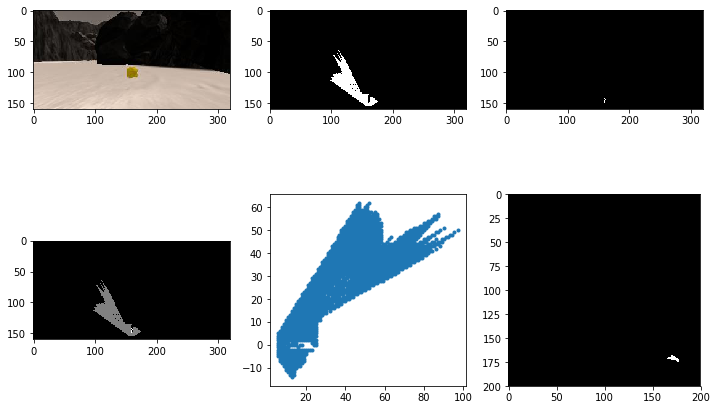

In [175]:
example_grid = '../calibration_images/example_grid1.jpg'
example_rock = '../calibration_images/example_rock1.jpg'
grid_img = mpimg.imread(example_grid)
rock_img = mpimg.imread(example_rock)

process_image(rock_img)

99.66999 85.58896999999999 56.82555
rover_yaw = [168.31410401]
yaw_rad = [2.93763529]
xpix_translated [17.0834374  17.10369203 17.12394665 ... 31.55659824 31.57685287
 31.59710749]
ypix_translated [114.90621652 115.00414379 115.10207106 ... 108.84918629 108.94711356
 109.04504083]
[MoviePy] >>>> Building video ../output/test_mapping.mp4
[MoviePy] Writing video ../output/test_mapping.mp4


  0%|                                                                                | 0/283 [00:00<?, ?it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [151.36686021]
yaw_rad = [2.64185009]
xpix_translated [126.24769766 126.29561762 126.34353758 ... 138.32677054 138.3746905
 138.42261046]
ypix_translated [55.49249608 55.58026667 55.66803727 ... 45.47970435 45.56747494
 45.65524554]


  0%|▎                                                                       | 1/283 [00:00<00:48,  5.79it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [123.19972327]
yaw_rad = [2.15024081]
xpix_translated [ 96.81932748  96.90300418  96.98668088 ... 102.74143801 102.82511471
 102.9087914 ]
ypix_translated [117.02941516 117.08417108 117.138927   ... 102.50052646 102.55528238
 102.6100383 ]


  1%|▌                                                                       | 2/283 [00:00<00:48,  5.82it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [90.46288013]
yaw_rad = [1.57887511]
xpix_translated [99.34698065 99.44697739 99.54697413 ... 96.47149045 96.57148719
 96.67148392]
ypix_translated [62.68176104 62.68256891 62.68337678 ... 47.25802751 47.25883538
 47.25964325]


  1%|▊                                                                       | 3/283 [00:00<00:47,  5.90it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [352.83779963]
yaw_rad = [6.15818133]
xpix_translated [120.85258646 120.84011859 120.82765072 ... 105.94678606 105.93431819
 105.92185033]
ypix_translated [115.92236263 115.82314291 115.72392319 ... 120.81900582 120.7197861
 120.62056639]


  1%|█                                                                       | 4/283 [00:00<00:47,  5.83it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [292.06751635]
yaw_rad = [5.0975398]
xpix_translated [179.23197066 179.13929648 179.04662231 ... 176.22643279 176.13375861
 176.04108443]
ypix_translated [107.18356454 107.14599465 107.10842476 ... 122.5824847  122.54491481
 122.50734492]


  2%|█▎                                                                      | 5/283 [00:00<00:47,  5.86it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [156.1789669]
yaw_rad = [2.72583719]
xpix_translated [156.01930237 156.05969049 156.1000786  ... 168.8957555  168.93614362
 168.97653173]
ypix_translated [127.90432553 127.99580668 128.08728783 ... 118.94012146 119.0316026
 119.12308375]


  2%|█▌                                                                      | 6/283 [00:01<00:46,  5.92it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [47.46188232]
yaw_rad = [0.82836612]
xpix_translated [173.38351208 173.45719485 173.53087762 ... 160.7613884  160.83507118
 160.90875395]
ypix_translated [149.64451619 149.57690814 149.50930008 ... 140.325611   140.25800295
 140.19039489]


  2%|█▊                                                                      | 7/283 [00:01<00:46,  5.92it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [220.92508065]
yaw_rad = [3.85587006]
xpix_translated [58.54743877 58.48193161 58.41642445 ... 72.1483822  72.08287504
 72.01736788]
ypix_translated [31.21914114 31.29469782 31.3702545  ... 39.04054369 39.11610037
 39.19165705]


  3%|██                                                                      | 8/283 [00:01<00:53,  5.17it/s]

99.67065 85.58999 56.82556999999999
rover_yaw = [267.6217379]
yaw_rad = [4.67088048]
xpix_translated [37.09319992 36.99328605 36.89337219 ... 40.72966327 40.62974941
 40.52983554]
ypix_translated [123.90201215 123.9061618  123.91031146 ... 139.16425753 139.16840719
 139.17255685]


  3%|██▎                                                                     | 9/283 [00:01<00:51,  5.36it/s]

99.67067 85.59003 56.825419999999994
rover_yaw = [262.23687088]
yaw_rad = [4.57689682]
xpix_translated [153.63791426 153.53883077 153.43974727 ... 158.78970357 158.69062007
 158.59153657]
ypix_translated [127.22375557 127.23726337 127.25077117 ... 142.06387238 142.07738018
 142.09088798]


  4%|██▌                                                                    | 10/283 [00:01<00:49,  5.52it/s]

99.67067 85.59003 56.825419999999994
rover_yaw = [296.87115943]
yaw_rad = [5.18137919]
xpix_translated [64.14376337 64.05456086 63.1625357  ... 59.94846074 59.85925822
 59.77005571]
ypix_translated [67.48758256 67.44238399 66.99039823 ... 82.6259258  82.58072722
 82.53552865]


  4%|██▊                                                                    | 11/283 [00:01<00:48,  5.66it/s]

99.67066 85.59003 56.825419999999994
rover_yaw = [205.86722463]
yaw_rad = [3.59306089]
xpix_translated [68.91813102 68.87450231 68.43821517 ... 84.12765663 84.08402791
 84.0403992 ]
ypix_translated [85.00274109 85.09272184 85.99252934 ... 88.93215973 89.02214048
 89.11212123]


  4%|███                                                                    | 12/283 [00:02<00:48,  5.55it/s]

99.67066 85.59003 56.825419999999994
rover_yaw = [134.13733865]
yaw_rad = [2.34113821]
xpix_translated [146.99509845 147.06686572 147.13863298 ... 155.5663424  155.63810967
 155.70987693]
ypix_translated [155.90644788 155.97608594 156.04572401 ... 142.76514744 142.83478551
 142.90442357]


  5%|███▎                                                                   | 13/283 [00:02<00:49,  5.48it/s]

99.67065 85.59003 56.825419999999994
rover_yaw = [228.92375115]
yaw_rad = [3.99547319]
xpix_translated [19.25235648 19.1769729  19.10158931 ... 31.63263126 31.55724767
 31.48186409]
ypix_translated [76.16334749 76.22905377 76.29476005 ... 85.80123089 85.86693717
 85.93264345]


  5%|███▌                                                                   | 14/283 [00:02<00:48,  5.56it/s]

99.67065 85.59003 56.82541
rover_yaw = [37.62022184]
yaw_rad = [0.65659674]
xpix_translated [104.67294975 104.73399222 104.7950347  ...  90.64373202  90.7047745
  90.76581697]
ypix_translated [173.75968636 173.68047894 173.60127151 ... 166.73536789 166.65616047
 166.57695304]


  5%|███▊                                                                   | 15/283 [00:02<00:46,  5.74it/s]

99.67064 85.59003 56.82541
rover_yaw = [321.62746977]
yaw_rad = [5.61345831]
xpix_translated [46.03972572 45.97764852 45.91557133 ... 35.82857765 35.76650045
 35.70442325]
ypix_translated [42.78407792 42.7056788  42.62727968 ... 54.69593986 54.61754075
 54.53914163]


  6%|████                                                                   | 16/283 [00:02<00:54,  4.89it/s]

99.67064 85.59003 56.82541
rover_yaw = [187.76168966]
yaw_rad = [3.27705969]
xpix_translated [ 95.65773036  95.64422506  95.63071975 ... 111.32180043 111.30829512
 111.29478981]
ypix_translated [122.46089594 122.55997977 122.65906361 ... 121.56819839 121.66728222
 121.76636606]


  6%|████▎                                                                  | 17/283 [00:03<00:51,  5.18it/s]

99.67063 85.59003 56.82541
rover_yaw = [240.43321877]
yaw_rad = [4.1963513]
xpix_translated [107.65832069 107.57134257 107.48436446 ... 117.86660429 117.77962618
 117.69264806]
ypix_translated [49.35196496 49.40130873 49.4506525  ... 61.26628181 61.31562557
 61.36496934]


  6%|████▌                                                                  | 18/283 [00:03<00:49,  5.40it/s]

99.67062 85.59003 56.82541
rover_yaw = [15.4388666]
yaw_rad = [0.26945905]
xpix_translated [183.09657021 183.12319121 183.14981222 ... 167.4536484  167.48026941
 167.50689041]
ypix_translated [57.78866906 57.69227755 57.59588605 ... 56.58077941 56.4843879
 56.3879964 ]


  7%|████▊                                                                  | 19/283 [00:03<00:47,  5.61it/s]

99.67062 85.59003 56.82541
rover_yaw = [99.18007392]
yaw_rad = [1.73101884]
xpix_translated [93.24666241 93.34538159 93.44410077 ... 92.74197027 92.84068945
 92.93940863]
ypix_translated [140.25839777 140.27435155 140.29030534 ... 124.57703029 124.59298408
 124.60893787]


  7%|█████                                                                  | 20/283 [00:03<00:46,  5.62it/s]

99.67062 85.59004 56.8254
rover_yaw = [147.66210942]
yaw_rad = [2.57718999]
xpix_translated [32.52069234 32.57418346 32.62767458 ... 43.92754609 43.98103721
 44.03452834]
ypix_translated [48.47243628 48.55692711 48.64141794 ... 37.70007872 37.78456955
 37.86906037]


  7%|█████▎                                                                 | 21/283 [00:03<00:47,  5.57it/s]

99.67062 85.59005 56.8254
rover_yaw = [170.12392129]
yaw_rad = [2.96922256]
xpix_translated [73.33659414 73.35374592 73.3708977  ... 87.99382848 88.01098026
 88.02813204]
ypix_translated [106.19974039 106.2982585  106.3967766  ... 100.60282326 100.70134136
 100.79985946]


  8%|█████▌                                                                 | 22/283 [00:03<00:45,  5.73it/s]

99.67062 85.59005 56.8254
rover_yaw = [3.22182154]
yaw_rad = [0.05623139]
xpix_translated [171.43269437 171.43831455 171.44393472 ... 155.88842983 155.89405
 155.89967018]
ypix_translated [136.55574489 136.45590294 136.356061   ... 138.685496   138.58565406
 138.48581212]


  8%|█████▊                                                                 | 23/283 [00:04<00:45,  5.68it/s]

99.6708 85.59031999999999 56.82637
rover_yaw = [20.56048622]
yaw_rad = [0.35884818]
xpix_translated [120.14451603 120.17963563 120.21475523 ... 104.67187781 104.70699742
 104.74211702]
ypix_translated [159.07117002 158.97753982 158.88390962 ... 156.47165725 156.37802706
 156.28439686]


  8%|██████                                                                 | 24/283 [00:04<00:45,  5.70it/s]

99.67083000000001 85.59038000000001 56.81548000000001
rover_yaw = [296.69477545]
yaw_rad = [5.17830071]
xpix_translated [180.90412988 180.81478864 180.72544741 ... 176.66610892 176.57676768
 176.48742645]
ypix_translated [143.6753023  143.63037855 143.58545479 ... 158.78156519 158.73664143
 158.69171768]


  9%|██████▎                                                                | 25/283 [00:04<00:56,  4.59it/s]

99.67175999999999 85.5918 56.8225
rover_yaw = [92.11664353]
yaw_rad = [1.60773873]
xpix_translated [165.10215288 165.20208465 165.30201642 ... 162.6729833  162.77291508
 162.87284685]
ypix_translated [41.3138717  41.3175651  41.3212585  ... 25.81357702 25.81727042
 25.82096382]


  9%|██████▌                                                                | 26/283 [00:04<00:52,  4.91it/s]

99.67331999999999 85.59421 56.715019999999996
rover_yaw = [73.58403732]
yaw_rad = [1.28428373]
xpix_translated [147.52585861 147.62178214 147.71770566 ... 140.20005509 140.29597861
 140.39190214]
ypix_translated [79.88394342 79.85568255 79.82742168 ... 65.98780717 65.9595463
 65.93128542]


 10%|██████▊                                                                | 27/283 [00:04<00:49,  5.13it/s]

99.67529 85.59719 56.69259
rover_yaw = [312.37072302]
yaw_rad = [5.4518976]
xpix_translated [151.42365302 151.35626052 151.28886802 ... 142.15340827 142.07952829
 142.00564831]
ypix_translated [73.66623334 73.74011332 73.8139933  ... 86.05463769 85.9872452
 85.9198527 ]


 10%|███████                                                                | 28/283 [00:05<00:47,  5.39it/s]

99.67777 85.60096 56.73291
rover_yaw = [346.83974554]
yaw_rad = [6.05349554]
xpix_translated [43.16615602 43.14338847 43.12062093 ... 28.87639899 28.85363145
 28.8308639 ]
ypix_translated [ 94.87464532  94.77727161  94.67989791 ... 101.39943222 101.30205851
 101.20468481]


 10%|███████▎                                                               | 29/283 [00:05<00:45,  5.57it/s]

99.68341 85.6096 56.871809999999996
rover_yaw = [109.4596237]
yaw_rad = [1.91043083]
xpix_translated [81.06157902 81.15586667 81.25015432 ... 83.26905636 83.36334401
 83.45763166]
ypix_translated [131.43779465 131.4711089  131.50442315 ... 115.88475495 115.9180692
 115.95138345]


 11%|███████▌                                                               | 30/283 [00:05<00:44,  5.64it/s]

99.68764 85.61605 56.75683000000001
rover_yaw = [52.10757392]
yaw_rad = [0.90944873]
xpix_translated [166.54398698 166.62290351 166.70182004 ... 156.61210217 156.6910187
 156.76993523]
ypix_translated [156.7424654  156.68104731 156.61962922 ... 144.95782861 144.89641052
 144.83499244]


 11%|███████▊                                                               | 31/283 [00:05<00:44,  5.67it/s]

99.69625 85.62921999999999 56.750859999999996
rover_yaw = [215.19479994]
yaw_rad = [3.75585779]
xpix_translated [123.50277571 123.4451399  123.38750408 ... 135.51125461 135.45361879
 135.39598298]
ypix_translated [76.3323674  76.41408712 76.49580684 ... 86.02548014 86.10719986
 86.18891958]


 11%|████████                                                               | 32/283 [00:05<00:43,  5.78it/s]

99.70283 85.63936 56.889109999999995
rover_yaw = [124.3192531]
yaw_rad = [2.16978029]
xpix_translated [43.62330009 43.70589098 43.78848187 ... 55.03137502 55.11396591
 55.1965568 ]
ypix_translated [84.58273289 84.63911325 84.69549361 ... 73.72428796 73.78066832
 73.83704868]


 12%|████████▎                                                              | 33/283 [00:05<00:43,  5.74it/s]

99.71024 85.65078000000001 56.9262
rover_yaw = [344.79833551]
yaw_rad = [6.01786621]
xpix_translated [72.25576765 72.22954592 72.2033242  ... 56.37198381 56.34576208
 56.31954036]
ypix_translated [30.65513684 30.55863596 30.46213507 ... 30.9297473  30.83324642
 30.73674553]


 12%|████████▌                                                              | 34/283 [00:06<00:42,  5.83it/s]

99.71786999999999 85.66252 56.97526
rover_yaw = [190.16855443]
yaw_rad = [3.31906741]
xpix_translated [54.62245179 54.60479734 54.58714288 ... 69.09203481 69.07438035
 69.05672589]
ypix_translated [64.15465116 64.25308043 64.35150969 ... 70.7121787  70.81060797
 70.90903723]


 12%|████████▊                                                              | 35/283 [00:06<00:42,  5.83it/s]

99.72574 85.67455 57.014480000000006
rover_yaw = [123.37946829]
yaw_rad = [2.15337795]
xpix_translated [65.48340621 65.56691072 65.65041523 ... 77.37988673 77.46339124
 77.54689575]
ypix_translated [139.46966678 139.52468493 139.57970308 ... 128.86571698 128.92073513
 128.97575329]


 13%|█████████                                                              | 36/283 [00:06<00:41,  5.91it/s]

99.73706999999999 85.69167 56.986019999999996
rover_yaw = [117.17341578]
yaw_rad = [2.0450619]
xpix_translated [44.17551394 44.26447678 44.35343961 ... 54.94490521 55.03386805
 55.12283089]
ypix_translated [100.32635657 100.37202509 100.41769361 ...  88.54415764  88.58982616
  88.63549468]


 13%|█████████▎                                                             | 37/283 [00:06<00:53,  4.56it/s]

99.74576 85.70506 56.935390000000005
rover_yaw = [309.95855737]
yaw_rad = [5.40979737]
xpix_translated [188.19866105 188.12201013 188.04535921 ... 175.01227794 174.93562702
 174.8589761 ]
ypix_translated [61.41431253 61.3500892  61.28586586 ... 70.45695045 70.39272711
 70.32850378]


 13%|█████████▌                                                             | 38/283 [00:06<00:50,  4.89it/s]

99.76088 85.72845 56.8792
rover_yaw = [32.8520869]
yaw_rad = [0.57337708]
xpix_translated [182.46723182 182.52147903 182.57572625 ... 171.75423112 171.80847833
 171.86272555]
ypix_translated [174.69598842 174.61198104 174.52797366 ... 162.89761497 162.81360759
 162.72960021]


 14%|█████████▊                                                             | 39/283 [00:07<00:47,  5.11it/s]

99.77776 85.75455 56.884809999999995
rover_yaw = [185.68671494]
yaw_rad = [3.24084455]
xpix_translated [ 90.44827362  90.43836472  90.42845582 ... 105.36621863 105.35630973
 105.34640082]
ypix_translated [30.42093659 30.52044445 30.61995231 ... 36.02672973 36.12623759
 36.22574544]


 14%|██████████                                                             | 40/283 [00:07<00:45,  5.31it/s]

99.79700000000001 85.78428000000001 56.86581999999999
rover_yaw = [55.58744222]
yaw_rad = [0.97018389]
xpix_translated [44.59908215 44.68158112 44.76408009 ... 39.27826309 39.36076205
 39.44326102]
ypix_translated [133.09808462 133.04156983 132.98505505 ... 118.07613786 118.01962307
 117.96310829]


 14%|██████████▎                                                            | 41/283 [00:07<00:44,  5.40it/s]

99.81023 85.8047 56.835519999999995
rover_yaw = [340.87940986]
yaw_rad = [5.94946805]
xpix_translated [89.08038175 89.047626   89.01487026 ... 73.18699476 73.15423901
 73.12148326]
ypix_translated [175.29286539 175.19838226 175.10389914 ... 176.46344211 176.36895898
 176.27447586]


 15%|██████████▌                                                            | 42/283 [00:07<00:43,  5.55it/s]

99.83139 85.83752 56.96938000000001
rover_yaw = [203.18038041]
yaw_rad = [3.54616661]
xpix_translated [21.02209971 20.98273699 20.94337428 ... 33.52562647 33.48626376
 33.44690104]
ypix_translated [13.97205253 14.06397955 14.15590657 ... 23.89484541 23.98677243
 24.07869945]


 15%|██████████▊                                                            | 43/283 [00:07<00:43,  5.55it/s]

99.84605 85.86028 57.063869999999994
rover_yaw = [171.91955307]
yaw_rad = [3.00056225]
xpix_translated [55.04923554 55.06329188 55.07734821 ... 70.88670561 70.90076195
 70.91481828]
ypix_translated [62.584066   62.68307317 62.78208034 ... 64.57769129 64.67669846
 64.77570563]


 16%|███████████                                                            | 44/283 [00:08<00:41,  5.73it/s]

99.86151 85.88438000000001 57.10579
rover_yaw = [1.71841976]
yaw_rad = [0.02999208]
xpix_translated [64.0180165  64.02101526 64.02401402 ... 48.74789143 48.75089019
 48.75388895]
ypix_translated [26.27721786 26.17726283 26.0773078  ... 21.71725291 21.61729789
 21.51734286]


 16%|███████████▎                                                           | 45/283 [00:08<00:40,  5.81it/s]

99.87763000000001 85.90944 57.08944
rover_yaw = [33.4248949]
yaw_rad = [0.58337447]
xpix_translated [82.82066911 82.87575345 82.93083779 ... 72.22615469 72.28123904
 72.33632338]
ypix_translated [46.05999747 45.97653661 45.89307575 ... 34.15511342 34.07165256
 33.98819169]


 16%|███████████▌                                                           | 46/283 [00:08<00:40,  5.87it/s]

99.90364 85.94996 57.10592
rover_yaw = [83.55874455]
yaw_rad = [1.45837521]
xpix_translated [154.91586967 155.01523841 155.11460715 ... 157.36171607 157.46108481
 157.56045355]
ypix_translated [139.21467859 139.20346015 139.1922417  ... 123.44071792 123.42949947
 123.41828103]


 17%|███████████▊                                                           | 47/283 [00:08<00:39,  5.93it/s]

99.92182 85.9783 57.13094
rover_yaw = [22.30128556]
yaw_rad = [0.38923086]
xpix_translated [133.83637133 133.87431902 133.91226671 ... 121.14412815 121.18207584
 121.22002354]
ypix_translated [144.75139527 144.65887515 144.56635503 ... 135.11412579 135.02160567
 134.92908555]


 17%|████████████                                                           | 48/283 [00:08<00:39,  5.89it/s]

99.95082 86.02351 57.156780000000005
rover_yaw = [168.91820574]
yaw_rad = [2.94817886]
xpix_translated [ 4.00154636  4.02076738  4.03998839 ... 19.92167734 19.94089835
 19.96011937]
ypix_translated [69.3886009  69.48673627 69.58487165 ... 70.55025048 70.64838586
 70.74652124]


 17%|████████████▎                                                          | 49/283 [00:08<00:39,  5.95it/s]

99.97074 86.05458 57.21354
rover_yaw = [121.64627471]
yaw_rad = [2.12312802]
xpix_translated [57.61082835 57.6959587  57.78108905 ... 69.26627678 69.35140712
 69.43653747]
ypix_translated [104.85322977 104.90569713 104.95816449 ...  93.9467857   93.99925307
  94.05172043]


 18%|████████████▌                                                          | 50/283 [00:09<00:39,  5.96it/s]

99.99143000000001 86.08694 57.22939
rover_yaw = [158.62850744]
yaw_rad = [2.76858974]
xpix_translated [33.08563621 33.12207756 33.15851891 ... 48.95722645 48.9936678
 49.03010914]
ypix_translated [120.96691185 121.06003558 121.1531593  ... 119.26614048 119.3592642
 119.45238793]


 18%|████████████▊                                                          | 51/283 [00:09<00:38,  5.97it/s]

100.0236 86.13731 57.23721
rover_yaw = [174.26757683]
yaw_rad = [3.041543]
xpix_translated [110.18148849 110.19147677 110.20146506 ... 125.92398414 125.93397243
 125.94396071]
ypix_translated [114.03792083 114.13742076 114.23692068 ... 116.67872197 116.77822189
 116.87772181]


 18%|█████████████                                                          | 52/283 [00:09<00:53,  4.29it/s]

100.0459 86.17214 57.2653
rover_yaw = [209.16292465]
yaw_rad = [3.65058171]
xpix_translated [15.70190913 15.65317966 15.60445019 ... 27.10313016 27.05440069
 27.00567122]
ypix_translated [20.64792601 20.73524976 20.82257352 ... 31.81986224 31.907186
 31.99450976]


 19%|█████████████▎                                                         | 53/283 [00:09<00:49,  4.69it/s]

100.0807 86.22678 57.22249
rover_yaw = [66.36065649]
yaw_rad = [1.15821195]
xpix_translated [56.71639594 56.8080047  56.89961346 ... 54.3888999  54.48050866
 54.57211742]
ypix_translated [174.58376286 174.54366504 174.50356722 ... 158.79190539 158.75180757
 158.71170976]


 19%|█████████████▌                                                         | 54/283 [00:09<00:46,  4.95it/s]

100.1048 86.26463000000001 57.227819999999994
rover_yaw = [288.06576025]
yaw_rad = [5.02769598]
xpix_translated [69.03093843 68.93586831 68.84079819 ... 60.26232472 60.1672546
 60.07218448]
ypix_translated [51.57785887 51.54684804 51.5158372  ... 64.91620261 64.88519177
 64.85418094]


 19%|█████████████▊                                                         | 55/283 [00:10<00:43,  5.24it/s]

100.1422 86.32311999999999 57.256009999999996
rover_yaw = [341.07840012]
yaw_rad = [5.95294109]
xpix_translated [131.49069798 131.45827057 131.42584317 ... 115.56091399 115.52848658
 115.49605917]
ypix_translated [107.31776644 107.22317012 107.1285738  ... 108.3385416  108.24394528
 108.14934896]


 20%|██████████████                                                         | 56/283 [00:10<00:43,  5.21it/s]

100.1679 86.36343000000001 57.274930000000005
rover_yaw = [138.49259289]
yaw_rad = [2.41715174]
xpix_translated [33.28149788 33.34776957 33.41404126 ... 47.59750752 47.66377921
 47.7300509 ]
ypix_translated [114.81038665 114.88527365 114.96016066 ... 107.74980112 107.82468812
 107.89957513]


 20%|██████████████▎                                                        | 57/283 [00:10<00:42,  5.35it/s]

100.2078 86.42599 57.31474
rover_yaw = [34.33809242]
yaw_rad = [0.59931277]
xpix_translated [60.05305864 60.10946616 60.16587367 ... 49.706033   49.76244051
 49.81884803]
ypix_translated [145.66400009 145.58142775 145.4988554  ... 133.50920432 133.42663197
 133.34405963]


 20%|██████████████▌                                                        | 58/283 [00:10<00:40,  5.52it/s]

100.2352 86.469 57.33373
rover_yaw = [150.70478961]
yaw_rad = [2.63029478]
xpix_translated [41.65278805 41.701719   41.75064996 ... 57.13838492 57.18731587
 57.23624683]
ypix_translated [109.44370971 109.53092073 109.61813174 ... 105.57120539 105.65841641
 105.74562743]


 21%|██████████████▊                                                        | 59/283 [00:10<00:39,  5.71it/s]

100.2775 86.53555 57.359790000000004
rover_yaw = [240.75641478]
yaw_rad = [4.20199213]
xpix_translated [117.9897746  117.90251953 117.81526446 ... 121.84832437 121.7610693
 121.67381423]
ypix_translated [139.51409888 139.56295123 139.61180359 ... 155.0031787  155.05203105
 155.10088341]


 21%|███████████████                                                        | 60/283 [00:10<00:38,  5.76it/s]

100.3065 86.58121 57.36985
rover_yaw = [327.21984065]
yaw_rad = [5.7110636]
xpix_translated [39.31415952 39.26001781 39.2058761  ... 24.09259396 24.03845225
 23.98431054]
ypix_translated [81.4632086  81.37913318 81.29505777 ... 86.26986459 86.18578918
 86.10171376]


 22%|███████████████▎                                                       | 61/283 [00:11<00:38,  5.81it/s]

100.3362 86.62803000000001 57.3862
rover_yaw = [260.43779715]
yaw_rad = [4.54549706]
xpix_translated [114.80766472 114.70905414 114.61044355 ... 113.22424147 113.12563089
 113.0270203 ]
ypix_translated [68.91873    68.93534183 68.95195366 ... 84.80245661 84.81906843
 84.83568026]


 22%|███████████████▌                                                       | 62/283 [00:11<00:38,  5.77it/s]

100.382 86.7002 57.402919999999995
rover_yaw = [51.92114147]
yaw_rad = [0.90619487]
xpix_translated [158.58730132 158.66601759 158.74473385 ... 152.47422057 152.55293684
 152.6316531 ]
ypix_translated [178.11197592 178.05030137 177.98862683 ... 163.33766566 163.27599111
 163.21431657]


 22%|███████████████▊                                                       | 63/283 [00:11<00:37,  5.81it/s]

100.4134 86.7497 57.41326
rover_yaw = [275.95216719]
yaw_rad = [4.8162739]
xpix_translated [155.34010032 155.24063944 155.14117855 ... 149.46633075 149.36686987
 149.26740899]
ypix_translated [40.53725171 40.5268819  40.51651208 ... 55.40832535 55.39795553
 55.38758572]


 23%|████████████████                                                       | 64/283 [00:11<00:37,  5.79it/s]

100.4454 86.80023 57.42235
rover_yaw = [112.87730876]
yaw_rad = [1.97008069]
xpix_translated [132.5599806  132.65211455 132.74424849 ... 142.60076422 142.69289817
 142.78503211]
ypix_translated [131.70045436 131.73933027 131.77820618 ... 119.22236699 119.2612429
 119.30011881]


 23%|████████████████▎                                                      | 65/283 [00:11<00:37,  5.89it/s]

100.4947 86.87801 57.43326999999999
rover_yaw = [192.74887116]
yaw_rad = [3.36410243]
xpix_translated [76.73092745 76.70885962 76.6867918  ... 90.78028198 90.75821416
 90.73614633]
ypix_translated [108.60554029 108.70307496 108.80060963 ... 116.29551021 116.39304487
 116.49057954]


 23%|████████████████▌                                                      | 66/283 [00:11<00:37,  5.81it/s]

100.5284 86.93118 57.441309999999994
rover_yaw = [272.95074367]
yaw_rad = [4.76388917]
xpix_translated [79.10022005 79.00035264 78.90048522 ... 73.7135665  73.61369909
 73.51383167]
ypix_translated [124.95681458 124.95166683 124.94651909 ... 140.09960043 140.09445269
 140.08930495]


 24%|████████████████▊                                                      | 67/283 [00:12<00:36,  5.84it/s]

100.5801 87.0129 57.45065
rover_yaw = [211.7872866]
yaw_rad = [3.69638547]
xpix_translated [123.55347305 123.50079633 123.44811961 ... 134.22049175 134.16781503
 134.11513831]
ypix_translated [56.47809495 56.56309591 56.64809687 ... 68.50035397 68.58535493
 68.67035589]


 24%|█████████████████                                                      | 68/283 [00:12<00:37,  5.75it/s]

100.6154 87.06869 57.4585
rover_yaw = [19.66710282]
yaw_rad = [0.3432557]
xpix_translated [144.81967905 144.85333451 144.88698997 ... 131.86620577 131.89986123
 131.9335167 ]
ypix_translated [130.81614042 130.72197403 130.62780763 ... 121.30154479 121.20737839
 121.113212  ]


 24%|█████████████████▎                                                     | 69/283 [00:12<00:37,  5.70it/s]

100.6696 87.15439 57.46998000000001
rover_yaw = [266.13955626]
yaw_rad = [4.64501153]
xpix_translated [158.55561026 158.45583716 158.35606406 ... 155.00287556 154.90310246
 154.80332936]
ypix_translated [159.87649648 159.88322913 159.88996177 ... 175.55125568 175.55798833
 175.56472098]


 25%|█████████████████▌                                                     | 70/283 [00:12<00:54,  3.88it/s]

100.7065 87.21281 57.47704
rover_yaw = [182.67252192]
yaw_rad = [3.18823696]
xpix_translated [61.68730971 61.68264697 61.67798423 ... 76.85607391 76.85141117
 76.84674843]
ypix_translated [100.09292835 100.19281959 100.29271082 ... 105.40598705 105.50587828
 105.60576952]


 25%|█████████████████▊                                                     | 71/283 [00:13<00:49,  4.31it/s]

100.7441 87.27225 57.484230000000004
rover_yaw = [23.26517388]
yaw_rad = [0.40605389]
xpix_translated [151.07069168 151.1101904  151.14968912 ... 138.73985846 138.77935718
 138.8188559 ]
ypix_translated [137.44572446 137.3538558  137.26198713 ... 127.13696352 127.04509485
 126.95322619]


 25%|██████████████████                                                     | 72/283 [00:13<00:45,  4.65it/s]

100.8016 87.36334000000001 57.496230000000004
rover_yaw = [189.81616733]
yaw_rad = [3.31291709]
xpix_translated [144.3848582  144.36780944 144.35076069 ... 158.75810812 158.74105936
 158.72401061]
ypix_translated [168.99304261 169.09157859 169.19011457 ... 176.24974205 176.34827803
 176.44681402]


 26%|██████████████████▎                                                    | 73/283 [00:13<00:42,  4.99it/s]

100.8408 87.42538 57.5027
rover_yaw = [64.95462855]
yaw_rad = [1.13367213]
xpix_translated [121.47221367 121.56281096 121.65340824 ... 119.21091443 119.30151172
 119.392109  ]
ypix_translated [69.22019386 69.17786028 69.1355267  ... 53.27853379 53.23620021
 53.19386663]


 26%|██████████████████▌                                                    | 74/283 [00:13<00:40,  5.20it/s]

100.9008 87.52039 57.5137
rover_yaw = [288.74696445]
yaw_rad = [5.03958523]
xpix_translated [62.86569773 62.77100301 62.67630829 ... 53.46565092 53.37095621
 53.27626149]
ypix_translated [74.07921897 74.04708004 74.01494111 ... 87.15167551 87.11953658
 87.08739765]


 27%|██████████████████▊                                                    | 75/283 [00:13<00:38,  5.36it/s]

100.9416 87.58498 57.520869999999995
rover_yaw = [227.15326143]
yaw_rad = [3.96457232]
xpix_translated [142.16207314 142.08875561 142.01543807 ... 149.18875893 149.11544139
 149.04212385]
ypix_translated [55.44577031 55.51377428 55.58177824 ... 69.93285722 70.00086118
 70.06886514]


 27%|███████████████████                                                    | 76/283 [00:13<00:37,  5.53it/s]

100.98299999999999 87.65063 57.52985
rover_yaw = [307.86042624]
yaw_rad = [5.37317807]
xpix_translated [100.72623369 100.64728287 100.56833206 ...  87.40604701  87.32709619
  87.24814538]
ypix_translated [130.14050352 130.07912952 130.01775552 ... 139.29160328 139.23022928
 139.16885528]


 27%|███████████████████▎                                                   | 77/283 [00:14<00:36,  5.67it/s]

101.0463 87.75102 57.540659999999995
rover_yaw = [107.73001202]
yaw_rad = [1.88024341]
xpix_translated [29.44179223 29.53704244 29.63229265 ... 38.79884578 38.89409599
 38.9893462 ]
ypix_translated [122.04429397 122.07474717 122.10520037 ... 108.86796865 108.89842186
 108.92887506]


 28%|███████████████████▌                                                   | 78/283 [00:14<00:35,  5.80it/s]

101.0892 87.81926 57.5657
rover_yaw = [261.33976126]
yaw_rad = [4.5612393]
xpix_translated [168.96548049 168.86662063 168.76776077 ... 166.34133938 166.24247952
 166.14361966]
ypix_translated [28.01360951 28.02866699 28.04372447 ... 43.99090226 44.00595974
 44.02101722]


 28%|███████████████████▊                                                   | 79/283 [00:14<00:35,  5.80it/s]

101.1536 87.92416 57.835409999999996
rover_yaw = [218.72155466]
yaw_rad = [3.81741127]
xpix_translated [107.49955663 107.43700301 107.37444939 ... 116.38688068 116.32432706
 116.26177344]
ypix_translated [41.28536172 41.36338123 41.44140075 ... 54.81959503 54.89761454
 54.97563406]


 28%|████████████████████                                                   | 80/283 [00:14<00:35,  5.79it/s]

101.1962 87.99583 58.207919999999994
rover_yaw = [270.50938631]
yaw_rad = [4.72127945]
xpix_translated [58.21492672 58.11493067 58.01493462 ... 52.97821686 52.87822081
 52.77822476]
ypix_translated [134.13708882 134.13619979 134.13531075 ... 149.49113942 149.49025039
 149.48936135]


 29%|████████████████████▎                                                  | 81/283 [00:14<00:34,  5.78it/s]

101.2594 88.10625999999999 59.00399
rover_yaw = [292.11786877]
yaw_rad = [5.09841861]
xpix_translated [74.91948991 74.82684879 74.73420766 ... 64.67441261 64.58177149
 64.48913036]
ypix_translated [84.24987929 84.21222797 84.17457665 ... 96.70934923 96.67169791
 96.63404659]


 29%|████████████████████▌                                                  | 82/283 [00:15<00:34,  5.77it/s]

101.3006 88.18200999999999 59.70157
rover_yaw = [352.71041532]
yaw_rad = [6.15595805]
xpix_translated [157.29009999 157.27741156 157.26472313 ... 141.41821391 141.40552548
 141.39283705]
ypix_translated [103.90452534 103.80533358 103.70614183 ... 101.19653117 101.09733942
 100.99814766]


 29%|████████████████████▊                                                  | 83/283 [00:15<00:34,  5.83it/s]

101.3412 88.25932 60.47002
rover_yaw = [250.78899824]
yaw_rad = [4.37709375]
xpix_translated [65.09284058 64.99840926 64.90397794 ... 65.81633868 65.72190736
 65.62747604]
ypix_translated [101.8269492  101.85985399 101.89275879 ... 117.88299325 117.91589804
 117.94880284]


 30%|█████████████████████                                                  | 84/283 [00:15<00:33,  5.89it/s]

101.4032 88.37705 61.36253000000001
rover_yaw = [220.36286807]
yaw_rad = [3.8460576]
xpix_translated [34.74270184 34.67793921 34.61317659 ... 43.7568276  43.69206497
 43.62730235]
ypix_translated [28.60697592 28.68317173 28.75936755 ... 41.78064423 41.85684004
 41.93303586]


 30%|█████████████████████▎                                                 | 85/283 [00:15<00:34,  5.80it/s]

101.4455 88.45683000000001 61.73438
rover_yaw = [271.26912129]
yaw_rad = [4.73453933]
xpix_translated [144.77011514 144.67013967 144.57016421 ... 140.6299599  140.52998443
 140.43000896]
ypix_translated [ 99.60360164  99.60138679  99.59917193 ... 114.91565946 114.9134446
 114.91122975]


 30%|█████████████████████▌                                                 | 86/283 [00:15<00:34,  5.78it/s]

101.4889 88.53773000000001 61.90596
rover_yaw = [299.99531487]
yaw_rad = [5.23590599]
xpix_translated [44.96142709 44.87482046 44.78821383 ... 33.88485916 33.79825253
 33.7116459 ]
ypix_translated [10.02752408  9.97753116  9.92753824 ... 21.41522107 21.36522816
 21.31523524]


 31%|█████████████████████▊                                                 | 87/283 [00:15<00:33,  5.81it/s]

101.5549 88.66154 61.974869999999996
rover_yaw = [147.87537844]
yaw_rad = [2.58091224]
xpix_translated [60.68591274 60.739089   60.79226525 ... 75.80194643 75.85512268
 75.90829894]
ypix_translated [117.61829508 117.70298443 117.78767378 ... 112.73203623 112.81672557
 112.90141492]


 31%|██████████████████████                                                 | 88/283 [00:16<00:33,  5.85it/s]

101.5995 88.74553 61.989180000000005
rover_yaw = [323.43288]
yaw_rad = [5.64496867]
xpix_translated [76.28094734 76.22137093 76.16179453 ... 61.41008203 61.35050562
 61.29092921]
ypix_translated [150.98115584 150.90083989 150.82052394 ... 156.78265261 156.70233666
 156.62202071]


 31%|██████████████████████▎                                                | 89/283 [00:16<00:33,  5.77it/s]

101.6669 88.87303 62.00551
rover_yaw = [28.8720889]
yaw_rad = [0.50391301]
xpix_translated [110.49078461 110.5390702  110.58735578 ...  98.83985916  98.88814475
  98.93643034]
ypix_translated [135.90822733 135.82065734 135.73308736 ... 125.14458778 125.0570178
 124.96944781]


 32%|██████████████████████▌                                                | 90/283 [00:16<00:33,  5.78it/s]

101.7122 88.95907 62.01611
rover_yaw = [5.35916122]
yaw_rad = [0.09353501]
xpix_translated [144.86634244 144.87568231 144.88502217 ... 129.92593354 129.93527341
 129.94461328]
ypix_translated [175.00498509 174.90542221 174.80585933 ... 169.38500448 169.2854416
 169.18587872]


 32%|██████████████████████▊                                                | 91/283 [00:16<00:32,  5.82it/s]

101.7581 89.0461 62.02626
rover_yaw = [99.49593382]
yaw_rad = [1.73653164]
xpix_translated [36.88200995 36.98063968 37.07926942 ... 43.56511387 43.6637436
 43.76237333]
ypix_translated [152.05048318 152.06698095 152.08347871 ... 137.55441054 137.5709083
 137.58740606]


 33%|███████████████████████                                                | 92/283 [00:17<00:52,  3.67it/s]

101.8279 89.17898000000001 62.0603
rover_yaw = [260.65825041]
yaw_rad = [4.54934469]
xpix_translated [176.74049997 176.6418262  176.54315243 ... 175.39199511 175.29332134
 175.19464757]
ypix_translated [157.6328199  157.64905218 157.66528447 ... 173.46163964 173.47787193
 173.49410422]


 33%|███████████████████████▎                                               | 93/283 [00:17<00:46,  4.13it/s]

101.8742 89.26921 62.24748
rover_yaw = [57.62126065]
yaw_rad = [1.00568072]
xpix_translated [47.60632001 47.69077268 47.77522535 ... 42.48416158 42.56861425
 42.65306692]
ypix_translated [100.18777043 100.13421908 100.08066774 ...  85.20065953  85.14710819
  85.09355684]


 33%|███████████████████████▌                                               | 94/283 [00:17<00:42,  4.40it/s]

101.92 89.36086 62.61549
rover_yaw = [137.723801]
yaw_rad = [2.40373379]
xpix_translated [129.35427779 129.42154831 129.48881883 ... 143.10336932 143.17063984
 143.23791037]
ypix_translated [133.93595597 134.00994703 134.08393809 ... 126.16598287 126.23997393
 126.31396499]


 34%|███████████████████████▊                                               | 95/283 [00:17<00:39,  4.72it/s]

101.9889 89.50081 63.19849
rover_yaw = [350.86312664]
yaw_rad = [6.12371678]
xpix_translated [144.25094291 144.23506356 144.21918421 ... 128.55408108 128.53820173
 128.52232238]
ypix_translated [86.00728982 85.90855864 85.80982746 ... 85.39204302 85.29331184
 85.19458066]


 34%|████████████████████████                                               | 96/283 [00:17<00:37,  5.01it/s]

102.0354 89.59543000000001 63.45715
rover_yaw = [171.46217269]
yaw_rad = [2.99257946]
xpix_translated [140.92884335 140.94368959 140.95853582 ... 156.55902983 156.57387606
 156.58872229]
ypix_translated [75.68989384 75.78878565 75.88767746 ... 76.07365261 76.17254441
 76.27143622]


 34%|████████████████████████▎                                              | 97/283 [00:17<00:35,  5.17it/s]

102.1059 89.7394 63.721019999999996
rover_yaw = [43.8254238]
yaw_rad = [0.76489794]
xpix_translated [72.49469543 72.56394176 72.6331881  ... 63.18472348 63.25396982
 63.32321616]
ypix_translated [183.72580573 183.65366043 183.58151513 ... 171.18609192 171.11394662
 171.04180132]


 35%|████████████████████████▌                                              | 98/283 [00:18<00:34,  5.31it/s]

102.1525 89.83711 64.00562
rover_yaw = [193.75067652]
yaw_rad = [3.38158723]
xpix_translated [34.48946872 34.46569899 34.44192925 ... 48.85384997 48.83008024
 48.8063105 ]
ypix_translated [172.36134193 172.45847586 172.55560978 ... 178.45022945 178.54736338
 178.64449731]


 35%|████████████████████████▊                                              | 99/283 [00:18<00:33,  5.54it/s]

102.1983 89.93626 64.45742
rover_yaw = [239.48282656]
yaw_rad = [4.17976383]
xpix_translated [79.91605559 79.82990789 79.74376019 ... 85.66857842 85.58243072
 85.49628302]
ypix_translated [33.89620939 33.94698905 33.99776871 ... 48.38166697 48.43244663
 48.48322628]


 35%|████████████████████████▋                                             | 100/283 [00:18<00:33,  5.51it/s]

102.2668 90.0874 65.16776
rover_yaw = [64.11602588]
yaw_rad = [1.11903575]
xpix_translated [164.302583   164.39255099 164.48251898 ... 159.55900634 159.64897433
 159.73894232]
ypix_translated [116.75153307 116.70787806 116.66422304 ... 101.93605196 101.89239695
 101.84874193]


 36%|████████████████████████▉                                             | 101/283 [00:18<00:32,  5.53it/s]

102.3126 90.1897 65.52991
rover_yaw = [159.20715487]
yaw_rad = [2.77868905]
xpix_translated [143.60282131 143.63832033 143.67381935 ... 158.70979996 158.74529898
 158.780798  ]
ypix_translated [115.30725879 115.40074579 115.49423279 ... 111.71014939 111.80363639
 111.8971234 ]


 36%|█████████████████████████▏                                            | 102/283 [00:18<00:31,  5.66it/s]

102.3819 90.34528 65.91586
rover_yaw = [239.55007294]
yaw_rad = [4.1809375]
xpix_translated [55.13443582 55.04822858 54.96202134 ... 61.30098973 61.21478249
 61.12857525]
ypix_translated [110.82471266 110.87539117 110.92606969 ... 125.06351924 125.11419775
 125.16487627]


 36%|█████████████████████████▍                                            | 103/283 [00:19<00:32,  5.61it/s]

102.4286 90.45034 66.03239
rover_yaw = [124.31829248]
yaw_rad = [2.16976352]
xpix_translated [82.18592517 82.268517   82.35110884 ... 92.35494054 92.43753237
 92.52012421]
ypix_translated [183.81781441 183.87419338 183.93057236 ... 172.11349356 172.16987254
 172.22625152]


 37%|█████████████████████████▋                                            | 104/283 [00:19<00:31,  5.63it/s]

102.4752 90.55662 66.20061
rover_yaw = [95.05532863]
yaw_rad = [1.65902846]
xpix_translated [174.0600567  174.1596677  174.25927871 ... 177.0108453  177.11045631
 177.21006731]
ypix_translated [151.77096141 151.77977318 151.78858495 ... 136.57185464 136.58066641
 136.58947818]


 37%|█████████████████████████▉                                            | 105/283 [00:19<00:31,  5.72it/s]

102.5432 90.71885 66.8178
rover_yaw = [87.95884062]
yaw_rad = [1.53517138]
xpix_translated [105.65736879 105.75730534 105.85724189 ... 106.70784537 106.80778192
 106.90771847]
ypix_translated [154.23621607 154.23265433 154.22909259 ... 138.78899953 138.78543779
 138.78187605]


 37%|██████████████████████████▏                                           | 106/283 [00:19<00:30,  5.71it/s]

102.5876 90.82874 67.36688000000001
rover_yaw = [28.05995517]
yaw_rad = [0.48973861]
xpix_translated [88.13301415 88.18005367 88.22709319 ... 75.1547079  75.20174743
 75.24878695]
ypix_translated [142.76600838 142.67776279 142.58951721 ... 134.37472915 134.28648357
 134.19823798]


 38%|██████████████████████████▍                                           | 107/283 [00:19<00:30,  5.78it/s]

102.6548 90.99569 67.95786
rover_yaw = [327.23984903]
yaw_rad = [5.71141281]
xpix_translated [39.23793705 39.1838247  39.12971236 ... 25.85451367 25.80040132
 25.74628897]
ypix_translated [112.91978334 112.83568903 112.75159471 ... 120.58033022 120.49623591
 120.41214159]


 38%|██████████████████████████▋                                           | 108/283 [00:19<00:30,  5.79it/s]

102.6999 91.10857 68.22184
rover_yaw = [44.7753832]
yaw_rad = [0.78147786]
xpix_translated [165.34820237 165.4186353  165.48906823 ... 154.83874938 154.90918231
 154.97961524]
ypix_translated [155.91225354 155.8412662  155.77027886 ... 144.63965855 144.56867121
 144.49768387]


 39%|██████████████████████████▉                                           | 109/283 [00:20<00:31,  5.53it/s]

102.766 91.28044 68.80521999999999
rover_yaw = [281.57303517]
yaw_rad = [4.91437655]
xpix_translated [23.75121018 23.6532432  23.55527622 ... 20.3678092  20.26984222
 20.17187525]
ypix_translated [34.80324429 34.7831826  34.76312091 ... 49.82997374 49.80991205
 49.78985036]


 39%|███████████████████████████▏                                          | 110/283 [00:20<00:30,  5.64it/s]

102.8079 91.39690999999999 69.4617
rover_yaw = [200.01563586]
yaw_rad = [3.4909314]
xpix_translated [25.57589149 25.54166383 25.50743618 ... 40.04571993 40.01149227
 39.97726462]
ypix_translated [ 98.76387214  98.85783207  98.95179199 ... 104.03493132 104.12889125
 104.22285117]


 39%|███████████████████████████▍                                          | 111/283 [00:20<00:30,  5.70it/s]

102.8484 91.51441 70.25198
rover_yaw = [346.69062952]
yaw_rad = [6.05089297]
xpix_translated [35.62780437 35.60478348 35.58176259 ... 20.73351289 20.710492
 20.68747111]
ypix_translated [ 96.42234516  96.32503103  96.22771691 ... 100.35681861 100.25950448
 100.16219036]


 40%|███████████████████████████▋                                          | 112/283 [00:20<00:29,  5.80it/s]

102.90700000000001 91.69287 71.47055
rover_yaw = [313.43146095]
yaw_rad = [5.47041097]
xpix_translated [181.20461696 181.13199723 181.0593775  ... 171.41614391 171.34352419
 171.27090446]
ypix_translated [113.73674354 113.6679949  113.59924626 ... 125.67641671 125.60766807
 125.53891944]


 40%|███████████████████████████▉                                          | 113/283 [00:20<00:29,  5.70it/s]

102.9441 91.81376999999999 72.28815999999999
rover_yaw = [330.97447586]
yaw_rad = [5.77659434]
xpix_translated [141.56886052 141.5203406  141.47182068 ... 129.31604235 129.26752243
 129.21900251]
ypix_translated [17.59575574 17.50831538 17.42087502 ... 27.25383251 27.16639215
 27.07895178]


 40%|████████████████████████████▏                                         | 114/283 [00:20<00:29,  5.76it/s]

102.9981 91.99757 73.38407
rover_yaw = [162.15734423]
yaw_rad = [2.83017956]
xpix_translated [80.62444603 80.65508643 80.68572684 ... 94.18067517 94.21131557
 94.24195598]
ypix_translated [96.67450185 96.769692   96.86488215 ... 88.52903369 88.62422384
 88.719414  ]


 41%|████████████████████████████▍                                         | 115/283 [00:21<00:29,  5.65it/s]

103.0315 92.12179 74.25146
rover_yaw = [63.61262852]
yaw_rad = [1.11024981]
xpix_translated [126.8315239  126.92110488 127.01068585 ... 113.71651445 113.80609542
 113.89567639]
ypix_translated [146.22445166 146.18000789 146.13556411 ... 135.54004588 135.4956021
 135.45115833]


 41%|████████████████████████████▋                                         | 116/283 [00:21<00:29,  5.69it/s]

103.0779 92.3102 75.75044
rover_yaw = [160.76714755]
yaw_rad = [2.80591605]
xpix_translated [81.22698836 81.25992917 81.29286998 ... 92.20987086 92.24281167
 92.27575248]
ypix_translated [112.57536676 112.66978553 112.76420429 ...  97.30525569  97.39967446
  97.49409322]


 41%|████████████████████████████▉                                         | 117/283 [00:21<00:28,  5.83it/s]

103.1073 92.43719 76.63359
rover_yaw = [97.86978282]
yaw_rad = [1.70814995]
xpix_translated [97.947349   98.34358173 99.036989   ... 89.35766643 89.45672461
 89.55578279]
ypix_translated [75.32141419 75.37618305 75.47202855 ... 58.58769514 58.60138735
 58.61507957]


 42%|█████████████████████████████▏                                        | 118/283 [00:21<00:27,  5.92it/s]

103.1502 92.63037 77.56241
rover_yaw = [211.60931417]
yaw_rad = [3.69327926]
xpix_translated [113.34466811 113.29225567 112.71571888 ... 132.27773131 132.22531888
 132.17290644]
ypix_translated [33.13043624 33.21560041 34.15240633 ... 31.74872801 31.83389219
 31.91905636]


 42%|█████████████████████████████▍                                        | 119/283 [00:21<00:27,  5.93it/s]

103.1788 92.76096 77.88167
rover_yaw = [200.15819629]
yaw_rad = [3.49341955]
xpix_translated [30.48534404 30.4508827  30.41642137 ... 49.52537036 49.49090902
 49.45644768]
ypix_translated [130.42214937 130.51602384 130.60989831 ... 123.24389068 123.33776515
 123.43163962]


 42%|█████████████████████████████▋                                        | 120/283 [00:22<00:48,  3.34it/s]

103.2078 92.89313 78.01364000000001
rover_yaw = [107.79043004]
yaw_rad = [1.88129791]
xpix_translated [146.81963497 146.91485302 147.01007106 ... 138.4800215  138.57523955
 138.67045759]
ypix_translated [150.28100579 150.31155942 150.34211305 ... 131.43158015 131.46213377
 131.4926874 ]


 43%|█████████████████████████████▉                                        | 121/283 [00:22<00:42,  3.84it/s]

103.2514 93.09423000000001 78.07328000000001
rover_yaw = [128.06138113]
yaw_rad = [2.23509275]
xpix_translated [22.36813787 22.35105333 22.33396879 ... 20.83940942 20.91814449
 20.99687957]
ypix_translated [62.12548707 61.98510146 61.84471586 ... 41.36921117 41.4308617
 41.49251223]


 43%|██████████████████████████████▏                                       | 122/283 [00:22<00:37,  4.28it/s]

103.2809 93.23 78.0602
rover_yaw = [79.24150125]
yaw_rad = [1.3830251]
xpix_translated [139.35709726 138.40315629 138.28624705 ... 122.98095032 123.07919259
 123.17743486]
ypix_translated [105.4998013  104.76495666 104.68538136 ...  93.24126095  93.22259397
  93.203927  ]


 43%|██████████████████████████████▍                                       | 123/283 [00:22<00:34,  4.66it/s]

103.3109 93.3671 78.00909
rover_yaw = [285.72941794]
yaw_rad = [4.98691911]
xpix_translated [152.95643134 153.02557714 153.09472294 ... 162.35356586 162.2573106
 162.16105533]
ypix_translated [20.24701195 20.37037669 20.49374143 ... 38.89275846 38.86564899
 38.83853952]


 44%|██████████████████████████████▋                                       | 124/283 [00:23<00:31,  4.98it/s]

103.3565 93.57526 77.91139
rover_yaw = [266.34723394]
yaw_rad = [4.64863619]
xpix_translated [79.1737896  79.27995741 79.38612522 ... 92.18997198 92.09017513
 91.99037829]
ypix_translated [127.19841137 127.29183726 127.38526315 ... 139.59433797 139.60070893
 139.60707989]


 44%|██████████████████████████████▉                                       | 125/283 [00:23<00:29,  5.30it/s]

103.3872 93.71566999999999 77.87611
rover_yaw = [13.2021976]
yaw_rad = [0.23042182]
xpix_translated [48.7816293  48.80446812 48.82730694 ... 30.5683753  30.59121412
 30.61405295]
ypix_translated [126.14830668 126.05094967 125.95359266 ... 136.35846725 136.26111023
 136.16375322]


 45%|███████████████████████████████▏                                      | 126/283 [00:23<00:29,  5.33it/s]

103.4181 93.85728 77.85344
rover_yaw = [152.52997089]
yaw_rad = [2.6621502]
xpix_translated [120.82954962 120.87567807 120.92180653 ... 127.9891219  128.03525036
 128.08137881]
ypix_translated [178.51964269 178.60836791 178.69709314 ... 158.90560372 158.99432894
 159.08305417]


 45%|███████████████████████████████▍                                      | 127/283 [00:23<00:28,  5.51it/s]

103.465 94.07202 77.82884
rover_yaw = [340.42131515]
yaw_rad = [5.94147279]
xpix_translated [183.92243335 183.88892324 183.85541313 ... 174.1042429  174.0707328
 174.03722269]
ypix_translated [19.84978191 19.75556369 19.66134547 ... 38.20088913 38.10667092
 38.0124527 ]


 45%|███████████████████████████████▋                                      | 128/283 [00:23<00:27,  5.65it/s]

103.4968 94.21663000000001 77.79743
rover_yaw = [20.42222386]
yaw_rad = [0.35643505]
xpix_translated [119.4805678  119.51546136 119.55035491 ... 100.1285168  100.16341036
 100.19830392]
ypix_translated [141.30923118 141.2155165  141.12180183 ... 149.14939202 149.05567735
 148.96196268]


 46%|███████████████████████████████▉                                      | 129/283 [00:23<00:26,  5.75it/s]

103.5464 94.43549 77.56206999999999
rover_yaw = [240.20579003]
yaw_rad = [4.19238192]
xpix_translated [ 88.32060099  88.45707119  88.37028962 ... 109.06337632 108.97659475
 108.88981318]
ypix_translated [78.73885277 78.77594571 78.82563434 ... 83.57075424 83.62044287
 83.6701315 ]


 46%|████████████████████████████████▏                                     | 130/283 [00:24<00:26,  5.71it/s]

103.5813 94.58248 77.24284
rover_yaw = [164.48761957]
yaw_rad = [2.87085054]
xpix_translated [147.80006624 147.8268109  147.85355556 ... 158.70762073 158.73436539
 158.76111004]
ypix_translated [109.34672673 109.443084   109.53944127 ...  91.06353075  91.15988802
  91.25624529]


 46%|████████████████████████████████▍                                     | 131/283 [00:24<00:26,  5.75it/s]

103.6179 94.7302 76.78392
rover_yaw = [174.56596835]
yaw_rad = [3.04675091]
xpix_translated [119.07730176 119.08677172 119.09624168 ... 133.03494793 133.0444179
 133.05388786]
ypix_translated [85.47479453 85.57434512 85.67389571 ... 69.58158487 69.68113546
 69.78068605]


 47%|████████████████████████████████▋                                     | 132/283 [00:24<00:26,  5.69it/s]

103.6753 94.95196 75.7267
rover_yaw = [26.58835676]
yaw_rad = [0.46405437]
xpix_translated [87.17111867 87.21587641 87.26063415 ... 68.38687586 68.43163359
 68.47639133]
ypix_translated [57.61644848 57.52702396 57.43759944 ... 60.73930324 60.64987872
 60.5604542 ]


 47%|████████████████████████████████▉                                     | 133/283 [00:24<00:25,  5.79it/s]

103.7159 95.09849 74.72603000000001
rover_yaw = [253.51312509]
yaw_rad = [4.42463873]
xpix_translated [ 94.36475064  94.26886216  94.17297369 ... 107.84460966 107.74872118
 107.65283271]
ypix_translated [63.8863792  63.91475877 63.94313834 ... 75.95714557 75.98552514
 76.01390471]


 47%|█████████████████████████████████▏                                    | 134/283 [00:24<00:25,  5.92it/s]

103.7826 95.31466 72.68961
rover_yaw = [150.88168634]
yaw_rad = [2.63338221]
xpix_translated [155.6296841  155.7756685  155.82432996 ... 164.89849581 164.94715727
 164.99581873]
ypix_translated [109.49428423 109.75636925 109.84373093 ...  94.48731487  94.57467654
  94.66203821]


 48%|█████████████████████████████████▍                                    | 135/283 [00:24<00:24,  5.98it/s]

103.8311 95.45625 71.1333
rover_yaw = [350.39689637]
yaw_rad = [6.11557953]
xpix_translated [102.70649773 102.68981551 102.6731333  ...  89.05706174  89.04037952
  89.0236973 ]
ypix_translated [138.69571791 138.59711921 138.49852051 ... 150.33585953 150.23726083
 150.13866213]


 48%|█████████████████████████████████▋                                    | 136/283 [00:25<00:25,  5.86it/s]

103.8835 95.59643 69.47205
rover_yaw = [281.70439731]
yaw_rad = [4.91666925]
xpix_translated [164.65004765 164.55212693 164.4542062  ... 170.9263555  170.82843478
 170.73051405]
ypix_translated [66.21050683 66.19022059 66.16993434 ... 83.23777789 83.21749165
 83.1972054 ]


 48%|█████████████████████████████████▉                                    | 137/283 [00:25<00:24,  5.90it/s]

103.9723 95.80537 67.06825
rover_yaw = [209.57361197]
yaw_rad = [3.65774955]
xpix_translated [18.22934158 18.17998744 18.1306333  ... 36.31170833 36.2623542
 36.21300006]
ypix_translated [152.44529637 152.5322686  152.61924084 ... 151.78347124 151.87044347
 151.9574157 ]


 49%|██████████████████████████████████▏                                   | 138/283 [00:25<00:24,  5.87it/s]

104.0359 95.94311 65.52441999999999
rover_yaw = [39.83797492]
yaw_rad = [0.69530383]
xpix_translated [79.59443654 79.65849841 79.72256029 ... 61.23509499 61.29915687
 61.36321875]
ypix_translated [113.24386396 113.16707805 113.09029214 ... 111.21049774 111.13371183
 111.05692592]


 49%|██████████████████████████████████▍                                   | 139/283 [00:25<00:24,  5.95it/s]

104.1021 96.0809 64.05154
rover_yaw = [149.34724097]
yaw_rad = [2.60660108]
xpix_translated [101.39798917 101.44897255 101.49995593 ... 109.29293749 109.34392087
 109.39490424]
ypix_translated [105.79133707 105.87736436 105.96339166 ...  88.90703101  88.9930583
  89.0790856 ]


 49%|██████████████████████████████████▋                                   | 140/283 [00:25<00:24,  5.87it/s]

104.2066 96.28983000000001 62.065940000000005
rover_yaw = [234.97623627]
yaw_rad = [4.10110899]
xpix_translated [128.67312803 128.59123662 128.50934522 ... 145.78246871 145.70057731
 145.6186859 ]
ypix_translated [112.4083797  112.46577132 112.52316293 ... 119.22310357 119.28049519
 119.3378868 ]


 50%|██████████████████████████████████▉                                   | 141/283 [00:25<00:23,  5.93it/s]

104.2803 96.42988000000001 60.780080000000005
rover_yaw = [230.65075255]
yaw_rad = [4.02561505]
xpix_translated [ 98.09432841  98.01699886  97.93966931 ... 115.28227032 115.20494077
 115.12761122]
ypix_translated [123.41998991 123.48339449 123.54679906 ... 129.24190136 129.30530594
 129.36871051]


 50%|███████████████████████████████████                                   | 142/283 [00:26<00:24,  5.87it/s]

104.4 96.63942 58.65003000000001
rover_yaw = [202.1255586]
yaw_rad = [3.5277565]
xpix_translated [113.67119992 113.63353617 113.59587241 ... 131.32689268 131.28922893
 131.25156517]
ypix_translated [163.22576582 163.31840189 163.41103797 ... 160.68873743 160.7813735
 160.87400957]


 51%|███████████████████████████████████▎                                  | 143/283 [00:26<00:23,  5.85it/s]

104.4846 96.7762 57.1133
rover_yaw = [69.70327156]
yaw_rad = [1.21655159]
xpix_translated [162.03901891 162.13280978 162.22660066 ... 148.81860116 148.91239203
 149.00618291]
ypix_translated [60.36850542 60.33381721 60.299129   ... 48.83852041 48.8038322
 48.76914399]


 51%|███████████████████████████████████▌                                  | 144/283 [00:26<00:23,  5.87it/s]

104.574 96.90939 55.41125
rover_yaw = [289.18968042]
yaw_rad = [5.04731209]
xpix_translated [88.53783317 88.44338962 88.34894606 ... 91.12583457 91.03139102
 90.93694746]
ypix_translated [142.55894764 142.52607798 142.49320833 ... 159.76569773 159.73282808
 159.69995842]


 51%|███████████████████████████████████▊                                  | 145/283 [00:26<00:23,  5.85it/s]

104.71799999999999 97.10325999999999 52.96165
rover_yaw = [285.10943624]
yaw_rad = [4.97609839]
xpix_translated [52.81346596 52.71692299 52.62038002 ... 55.94342776 55.84688479
 55.75034182]
ypix_translated [24.12784315 24.1017768  24.07571045 ... 40.92437074 40.89830439
 40.87223804]


 52%|████████████████████████████████████                                  | 146/283 [00:26<00:23,  5.87it/s]

104.8186 97.23083000000001 51.45167
rover_yaw = [42.97759993]
yaw_rad = [0.75010062]
xpix_translated [71.24194635 71.31011759 71.37828883 ... 55.47569238 55.54386362
 55.61203485]
ypix_translated [43.5404111  43.46724907 43.39408704 ... 37.87073424 37.79757221
 37.72441019]


 52%|████████████████████████████████████▎                                 | 147/283 [00:26<00:23,  5.78it/s]

104.9224 97.35765 50.0022
rover_yaw = [89.53139557]
yaw_rad = [1.56261764]
xpix_translated [27.93385142 28.03384807 28.13384473 ... 21.80810167 21.90809832
 22.00809498]
ypix_translated [149.18175056 149.1809327  149.18011484 ... 133.83133721 133.83051935
 133.82970149]


 52%|████████████████████████████████████▌                                 | 148/283 [00:27<00:23,  5.80it/s]

105.0851 97.54298 47.7893
rover_yaw = [148.64557964]
yaw_rad = [2.59435478]
xpix_translated [126.2855823  126.33761535 126.3896484  ... 136.47075968 136.52279273
 136.57482577]
ypix_translated [149.13447088 149.21986738 149.30526388 ... 136.25378139 136.33917789
 136.42457439]


 53%|████████████████████████████████████▊                                 | 149/283 [00:27<00:22,  5.87it/s]

105.1978 97.6636 46.28237
rover_yaw = [318.80185054]
yaw_rad = [5.56414195]
xpix_translated [95.04166867 94.97580215 94.90993564 ... 86.68161073 86.61574421
 86.54987769]
ypix_translated [28.25403698 28.17879336 28.10354974 ... 42.08441771 42.00917409
 41.93393048]


 53%|█████████████████████████████████████                                 | 150/283 [00:27<00:23,  5.70it/s]

105.3751 97.83971 44.04572
rover_yaw = [294.52371196]
yaw_rad = [5.1404085]
xpix_translated [108.50600242 108.41502346 108.32404451 ... 106.20798063 106.11700167
 106.02602272]
ypix_translated [56.24170837 56.20020139 56.15869441 ... 72.12028185 72.07877487
 72.03726789]


 53%|█████████████████████████████████████▎                                | 151/283 [00:27<00:23,  5.71it/s]

105.4971 97.95413 42.55407
rover_yaw = [332.92244584]
yaw_rad = [5.81059283]
xpix_translated [82.26233906 82.21681945 82.17129983 ... 70.2800599  70.23454029
 70.18902067]
ypix_translated [20.30602088 20.21698176 20.12794264 ... 30.6995278  30.61048868
 30.52144956]


 54%|█████████████████████████████████████▌                                | 152/283 [00:27<00:22,  5.79it/s]

105.6225 98.06591 41.06266
rover_yaw = [128.20738462]
yaw_rad = [2.23764099]
xpix_translated [162.8807549  162.95933262 163.03791034 ... 169.73416149 169.81273921
 169.89131693]
ypix_translated [97.13764955 97.19950052 97.26135149 ... 82.93374804 82.99559901
 83.05744998]


 54%|█████████████████████████████████████▊                                | 153/283 [00:27<00:21,  5.92it/s]

105.7513 98.17452 39.58194
rover_yaw = [237.43361725]
yaw_rad = [4.14399838]
xpix_translated [68.83215587 68.74787904 68.6636022  ... 79.64991751 79.56564068
 79.48136384]
ypix_translated [148.78061076 148.8344384  148.88826604 ... 160.1444144  160.19824204
 160.25206968]


 54%|██████████████████████████████████████                                | 154/283 [00:28<00:42,  3.05it/s]

105.9511 98.33268000000001 37.37595
rover_yaw = [124.78268246]
yaw_rad = [2.17786866]
xpix_translated [ 96.39228439  96.47441656  96.55654873 ... 103.04201446 103.12414662
 103.20627879]
ypix_translated [118.26251339 118.31955992 118.37660646 ... 104.13094978 104.18799631
 104.24504285]


 55%|██████████████████████████████████████▎                               | 155/283 [00:28<00:36,  3.54it/s]

106.0881 98.43437 35.897040000000004
rover_yaw = [198.60104488]
yaw_rad = [3.46624213]
xpix_translated [75.14186451 75.10996685 75.07806919 ... 90.43915695 90.40725929
 90.37536163]
ypix_translated [59.0637195  59.15849576 59.25327202 ... 61.89088134 61.98565759
 62.08043385]


 55%|██████████████████████████████████████▌                               | 156/283 [00:29<00:31,  4.04it/s]

106.2282 98.53296999999999 34.41616
rover_yaw = [128.71456693]
yaw_rad = [2.24649299]
xpix_translated [54.12973136 54.2077585  54.28578564 ... 62.1229536  62.20098074
 62.27900788]
ypix_translated [110.39018701 110.45273111 110.51527522 ...  97.06058093  97.12312504
  97.18566914]


 55%|██████████████████████████████████████▊                               | 157/283 [00:29<00:28,  4.50it/s]

106.4444 98.67451 32.218790000000006
rover_yaw = [236.59320943]
yaw_rad = [4.12933049]
xpix_translated [51.73462468 51.65114642 51.56766815 ... 61.88311699 61.79963873
 61.71616047]
ypix_translated [33.3706238  33.42568177 33.48073974 ... 45.12511672 45.18017469
 45.23523266]


 56%|███████████████████████████████████████                               | 158/283 [00:29<00:25,  4.90it/s]

106.59200000000001 98.76510999999999 30.74901
rover_yaw = [333.82462803]
yaw_rad = [5.82633888]
xpix_translated [65.41100873 65.36689671 65.3227847  ... 52.4284368  52.38432479
 52.34021277]
ypix_translated [103.61492373 103.52517892 103.43543412 ... 112.11332512 112.02358031
 111.93383551]


 56%|███████████████████████████████████████▎                              | 159/283 [00:29<00:23,  5.20it/s]

106.7424 98.85236 29.266609999999996
rover_yaw = [200.91233252]
yaw_rad = [3.50658171]
xpix_translated [18.6230883  18.58739439 18.55170049 ... 33.6154508  33.57975689
 33.54406299]
ypix_translated [166.95643765 167.04985041 167.14326318 ... 170.86528232 170.95869509
 171.05210786]


 57%|███████████████████████████████████████▌                              | 160/283 [00:29<00:22,  5.46it/s]

106.9736 98.9761 27.0724
rover_yaw = [306.89131696]
yaw_rad = [5.35626393]
xpix_translated [122.50448337 122.42450581 122.34452824 ... 114.61949693 114.53951937
 114.4595418 ]
ypix_translated [146.01522456 145.95519466 145.89516476 ... 159.35227779 159.29224789
 159.23221799]


 57%|███████████████████████████████████████▊                              | 161/283 [00:29<00:22,  5.51it/s]

107.1309 99.05443000000001 25.60793
rover_yaw = [353.59425573]
yaw_rad = [6.17138398]
xpix_translated [73.29587594 73.28471908 73.27356223 ... 58.15937501 58.14821815
 58.1370613 ]
ypix_translated [127.07261843 126.97324276 126.87386709 ... 130.28140941 130.18203374
 130.08265807]


 57%|████████████████████████████████████████                              | 162/283 [00:30<00:21,  5.64it/s]

107.2907 99.12914 24.13171
rover_yaw = [21.01028288]
yaw_rad = [0.36669861]
xpix_translated [124.0326229  124.06847645 124.10433    ... 109.15452534 109.19037889
 109.22623244]
ypix_translated [92.41968022 92.32632861 92.232977   ... 88.20515615 88.11180454
 88.01845293]


 58%|████████████████████████████████████████▎                             | 163/283 [00:30<00:21,  5.57it/s]

107.45299999999999 99.19995 22.658070000000002
rover_yaw = [237.68036232]
yaw_rad = [4.14830489]
xpix_translated [109.41603564 109.33152778 109.24701992 ... 118.74812506 118.66361719
 118.57910933]
ypix_translated [123.95868958 124.01215379 124.06561799 ... 136.27786598 136.33133019
 136.38479439]


 58%|████████████████████████████████████████▌                             | 164/283 [00:30<00:21,  5.66it/s]

107.7011 99.29843000000001 20.4811
rover_yaw = [113.17210442]
yaw_rad = [1.97522584]
xpix_translated [157.72943403 157.82136674 157.91329944 ... 162.5941221  162.6860548
 162.7779875 ]
ypix_translated [54.4794117  54.51876113 54.55811057 ... 39.81023278 39.84958222
 39.88893166]


 58%|████████████████████████████████████████▊                             | 165/283 [00:30<00:20,  5.65it/s]

107.8691 99.35991999999999 19.043879999999998
rover_yaw = [19.80450809]
yaw_rad = [0.34565387]
xpix_translated [90.47472025 90.50860145 90.54248264 ... 75.57899256 75.61287376
 75.64675495]
ypix_translated [156.4849367  156.39085129 156.29676588 ... 152.39625763 152.30217222
 152.20808681]


 59%|█████████████████████████████████████████                             | 166/283 [00:30<00:20,  5.77it/s]

108.039 99.41705 17.58406
rover_yaw = [255.29439984]
yaw_rad = [4.45572784]
xpix_translated [132.27603796 132.17931367 132.08258937 ... 137.15260918 137.05588489
 136.95916059]
ypix_translated [34.8570049  34.88239015 34.9077754  ... 49.49869378 49.52407903
 49.54946428]


 59%|█████████████████████████████████████████▎                            | 167/283 [00:30<00:20,  5.75it/s]

108.2115 99.47005 16.13737
rover_yaw = [311.2422932]
yaw_rad = [5.43220279]
xpix_translated [111.24846413 111.17327128 111.09807843 ... 102.14879594 102.0736031
 101.99841025]
ypix_translated [52.13308212 52.06715765 52.00123319 ... 64.6357234  64.56979893
 64.50387446]


 59%|█████████████████████████████████████████▌                            | 168/283 [00:31<00:20,  5.69it/s]

108.4734 99.54164 13.96394
rover_yaw = [122.70004972]
yaw_rad = [2.14151986]
xpix_translated [13.00684585 13.09099688 13.17514792 ... 20.31674566 20.40089669
 20.48504772]
ypix_translated [151.77073424 151.82475835 151.87878245 ... 138.16318616 138.21721026
 138.27123437]


 60%|█████████████████████████████████████████▊                            | 169/283 [00:31<00:19,  5.76it/s]

108.6505 99.58436999999999 12.543460000000001
rover_yaw = [11.45732639]
yaw_rad = [0.19996807]
xpix_translated [71.91866037 71.93852417 71.95838797 ... 56.56730793 56.58717174
 56.60703554]
ypix_translated [141.05456931 140.95656202 140.85855473 ... 139.26963835 139.17163106
 139.07362377]


 60%|██████████████████████████████████████████                            | 170/283 [00:31<00:20,  5.64it/s]

108.8291 99.62321999999999 11.10295
rover_yaw = [176.01305774]
yaw_rad = [3.07200738]
xpix_translated [101.92570468 101.93265759 101.9396105  ... 117.19804761 117.20500052
 117.21195344]
ypix_translated [171.32458809 171.42434609 171.52410408 ... 168.95698565 169.05674364
 169.15650163]


 60%|██████████████████████████████████████████▎                           | 171/283 [00:31<00:19,  5.70it/s]

109.1 99.67268 8.941550999999999
rover_yaw = [168.7360838]
yaw_rad = [2.94500023]
xpix_translated [51.87084848 51.96892227 52.06699605 ... 66.7398174  66.75935025
 66.7788831 ]
ypix_translated [91.59870618 91.57917333 91.55964047 ... 87.41376134 87.51183512
 87.60990891]


 61%|██████████████████████████████████████████▌                           | 172/283 [00:31<00:20,  5.54it/s]

109.2824 99.70014 7.503280999999999
rover_yaw = [223.47317395]
yaw_rad = [3.90034268]
xpix_translated [159.18166174 159.2542314  159.32680105 ... 166.36228972 166.29348823
 166.22468675]
ypix_translated [59.25726853 59.32607002 59.39487151 ... 65.92724468 65.99981434
 66.07238399]


 61%|██████████████████████████████████████████▊                           | 173/283 [00:31<00:19,  5.53it/s]

109.4658 99.72329 6.06736
rover_yaw = [150.84415263]
yaw_rad = [2.63272712]
xpix_translated [29.46051258 29.54784236 29.63517213 ... 36.78610623 36.83482491
 36.8835436 ]
ypix_translated [105.01927366 104.97055497 104.92183629 ... 100.70352602 100.7908558
 100.87818558]


 61%|███████████████████████████████████████████                           | 174/283 [00:32<00:19,  5.62it/s]

109.6512 99.7411 4.633476
rover_yaw = [30.01792163]
yaw_rad = [0.52391157]
xpix_translated [75.51140907 75.42482217 75.33823528 ... 67.78208274 67.83210982
 67.88213691]
ypix_translated [32.69996035 32.64993327 32.59990618 ... 27.88773483 27.80114793
 27.71456104]


 62%|███████████████████████████████████████████▎                          | 175/283 [00:32<00:18,  5.74it/s]

109.8367 99.7557 3.278915
rover_yaw = [20.9336037]
yaw_rad = [0.36536031]
xpix_translated [175.74545581 175.6520563  175.55865679 ... 166.71327594 166.74900452
 166.78473311]
ypix_translated [128.71528532 128.67955674 128.64382816 ... 124.61775841 124.5243589
 124.43095939]


 62%|███████████████████████████████████████████▌                          | 176/283 [00:32<00:18,  5.79it/s]

110.1172 99.77056 1.210754
rover_yaw = [196.87939629]
yaw_rad = [3.43619369]
xpix_translated [31.14984607 31.31219387 30.55726281 ... 37.55993339 37.53089758
 37.50186177]
ypix_translated [102.59335023 102.74711365 105.23510061 ... 107.98693721 108.08262902
 108.17832082]


 63%|███████████████████████████████████████████▊                          | 177/283 [00:32<00:18,  5.67it/s]

110.305 99.773 359.7514
rover_yaw = [332.2371367]
yaw_rad = [5.79863193]
xpix_translated [37.6057482  37.38219026 37.15863233 ... 28.98015134 28.93357002
 28.8869887 ]
ypix_translated [169.62417979 169.62885412 169.63352845 ... 169.98345531 169.894967
 169.80647869]


 63%|████████████████████████████████████████████                          | 178/283 [00:32<00:18,  5.76it/s]

110.4939 99.77105999999999 358.3399
rover_yaw = [183.56047486]
yaw_rad = [3.20373466]
xpix_translated [83.06529119 83.16509817 83.26490515 ... 90.37071888 90.36450867
 90.35829847]
ypix_translated [95.30978385 95.31599406 95.32220426 ... 98.66995146 98.76975844
 98.86956542]


 63%|████████████████████████████████████████████▎                         | 179/283 [00:33<00:18,  5.76it/s]

110.7779 99.76071999999999 356.2529
rover_yaw = [236.76640421]
yaw_rad = [4.13235331]
xpix_translated [128.49589931 128.46706038 128.52186575 ... 130.01332898 129.92968467
 129.84604036]
ypix_translated [86.13337293 86.27182262 86.35546693 ... 94.10566289 94.16046827
 94.21527364]


 64%|████████████████████████████████████████████▌                         | 180/283 [00:33<00:18,  5.58it/s]

110.9682 99.7477 354.8669
rover_yaw = [165.57311744]
yaw_rad = [2.88979605]
xpix_translated [121.32953663 121.62007654 121.64499097 ... 129.48714284 129.51205727
 129.5369717 ]
ypix_translated [68.27785999 68.2031167  68.29996333 ... 69.48345563 69.58030227
 69.67714891]


 64%|████████████████████████████████████████████▊                         | 181/283 [00:33<00:17,  5.67it/s]

111.1586 99.73002 353.4712
rover_yaw = [257.78209779]
yaw_rad = [4.49914636]
xpix_translated [36.03519732 36.0009514  35.94554245 ... 34.23094246 34.13320748
 34.03547249]
ypix_translated [164.25240472 164.56677269 164.78340567 ... 172.9308069  172.95196992
 172.97313294]


 64%|█████████████████████████████████████████████                         | 182/283 [00:33<00:18,  5.47it/s]

111.4444 99.69476 351.37699999999995
rover_yaw = [359.43246954]
yaw_rad = [6.27328003]
xpix_translated [86.2455925  86.04659282 86.0446118  ... 78.81029711 78.8093066
 78.80831609]
ypix_translated [134.21653309 134.31850921 134.11851902 ... 130.69000753 130.59001244
 130.49001734]


 65%|█████████████████████████████████████████████▎                        | 183/283 [00:33<00:17,  5.67it/s]

111.6347 99.66462 349.9948
rover_yaw = [201.85417816]
yaw_rad = [3.52302002]
xpix_translated [163.55864151 164.09666179 164.24506408 ... 169.71708843 169.67986386
 169.6426393 ]
ypix_translated [17.0093549  17.54836712 17.71562967 ... 24.22000893 24.31282235
 24.40563578]


 65%|█████████████████████████████████████████████▌                        | 184/283 [00:33<00:17,  5.78it/s]

111.9206 99.61458 348.0704
rover_yaw = [116.78018262]
yaw_rad = [2.03819869]
xpix_translated [82.13996191 82.31934984 82.09658421 ... 89.04429821 89.13357238
 89.22284655]
ypix_translated [153.14226614 153.00877467 152.78432987 ... 148.56185783 148.60691471
 148.65197158]


 65%|█████████████████████████████████████████████▊                        | 185/283 [00:34<00:16,  5.78it/s]

112.1109 99.57439000000001 346.7065
rover_yaw = [345.29900352]
yaw_rad = [6.02660452]
xpix_translated [56.2195319  56.12280557 56.00070176 ... 47.79769293 47.77231545
 47.74693798]
ypix_translated [175.33151602 175.3568935  175.28554464 ... 172.78541541 172.68868908
 172.59196274]


 66%|██████████████████████████████████████████████                        | 186/283 [00:34<00:16,  5.82it/s]

112.3008 99.52911999999999 345.4606
rover_yaw = [210.80085721]
yaw_rad = [3.67916902]
xpix_translated [81.87987766 82.08635776 82.29283786 ... 87.75053129 87.69932572
 87.64812015]
ypix_translated [33.28630885 33.52582079 33.76533273 ... 41.21003436 41.29592959
 41.38182481]


 66%|██████████████████████████████████████████████▎                       | 187/283 [00:34<00:16,  5.75it/s]

112.5858 99.45514 343.9397
rover_yaw = [207.01312308]
yaw_rad = [3.61306059]
xpix_translated [157.59793815 157.64160895 157.7306992  ... 161.74146346 161.696044
 161.65062455]
ypix_translated [171.37640158 171.51091129 171.55633075 ... 179.10111504 179.19020529
 179.27929555]


 66%|██████████████████████████████████████████████▌                       | 188/283 [00:34<00:16,  5.83it/s]

112.77600000000001 99.40215 343.1592
rover_yaw = [264.31289035]
yaw_rad = [4.61313019]
xpix_translated [66.60657455 66.11894519 66.01943741 ... 62.21543889 62.1159311
 62.01642331]
ypix_translated [113.34823536 113.49729109 113.50720068 ... 120.71966179 120.72957138
 120.73948097]


 67%|██████████████████████████████████████████████▋                       | 189/283 [00:34<00:16,  5.71it/s]

112.9664 99.34651 342.5939
rover_yaw = [166.50893984]
yaw_rad = [2.90612923]
xpix_translated [123.84989558 123.91988367 123.94321303 ... 131.58206813 131.60539749
 131.65205622]
ypix_translated [160.14281066 160.43453256 160.53177319 ... 163.22396429 163.32120492
 163.51568619]


 67%|██████████████████████████████████████████████▉                       | 190/283 [00:34<00:16,  5.79it/s]

113.1575 99.28871 342.2404
rover_yaw = [44.27103854]
yaw_rad = [0.77267539]
xpix_translated [79.01731122 79.08711656 79.15692191 ... 77.2894411  77.35924644
 77.42905178]
ypix_translated [147.05172674 146.98012217 146.9085176  ... 139.08275787 139.0111533
 138.93954873]


 67%|███████████████████████████████████████████████▏                      | 191/283 [00:35<00:15,  5.91it/s]

113.4448 99.19936 341.9935
rover_yaw = [45.5509788]
yaw_rad = [0.79501456]
xpix_translated [70.64320058 70.71458796 70.78597534 ... 69.30792907 69.37931645
 69.45070383]
ypix_translated [72.76171336 72.69168592 72.62165848 ... 64.54605453 64.47602709
 64.40599965]


 68%|███████████████████████████████████████████████▍                      | 192/283 [00:35<00:15,  5.91it/s]

113.6363 99.13851 341.921
rover_yaw = [294.81556155]
yaw_rad = [5.14550224]
xpix_translated [165.61868319 165.48594698 164.75981616 ... 157.50711078 157.41634443
 157.32557808]
ypix_translated [158.40802447 158.45682096 158.12106206 ... 162.36938699 162.32741713
 162.28544726]


 68%|███████████████████████████████████████████████▋                      | 193/283 [00:35<00:15,  5.92it/s]

113.82799999999999 99.07708000000001 341.8993
rover_yaw = [58.96696475]
yaw_rad = [1.02916768]
xpix_translated [61.87691421 61.91104801 61.94518181 ... 63.25475029 63.34043731
 63.42612433]
ypix_translated [176.64361919 176.50637895 176.36913871 ... 167.29527346 167.24372024
 167.19216702]


 69%|███████████████████████████████████████████████▉                      | 194/283 [00:35<00:15,  5.88it/s]

114.02 99.01573 341.9667
rover_yaw = [287.53030794]
yaw_rad = [5.01835057]
xpix_translated [57.72578286 58.23767546 57.44470823 ... 50.19201734 50.09666156
 50.00130579]
ypix_translated [132.16104454 132.53248224 132.38686982 ... 137.75142709 137.72130607
 137.69118504]


 69%|████████████████████████████████████████████████▏                     | 195/283 [00:35<00:15,  5.82it/s]

114.3093 98.92374000000001 342.1723
rover_yaw = [11.68597343]
yaw_rad = [0.20395871]
xpix_translated [110.10050195 109.84722974 109.76955725 ... 103.09659206 103.11684681
 103.13710157]
ypix_translated [170.84866613 170.59204738 170.47386538 ... 162.25185009 162.15392284
 162.0559956 ]


 69%|████████████████████████████████████████████████▍                     | 196/283 [00:35<00:14,  5.82it/s]

114.5023 98.86247 342.2795
rover_yaw = [206.45549036]
yaw_rad = [3.60332807]
xpix_translated [93.45754261 93.50252044 93.72569925 ... 97.5453938  97.50084355
 97.45629331]
ypix_translated [100.23947471 100.37355303 100.14951906 ... 109.75732492 109.84685299
 109.93638107]


 70%|████████████████████████████████████████████████▋                     | 197/283 [00:36<00:32,  2.62it/s]

114.7918 98.77076 342.3696
rover_yaw = [287.30576653]
yaw_rad = [5.01443159]
xpix_translated [76.70346061 76.67371351 76.57824042 ... 67.64198872 67.54651564
 67.45104255]
ypix_translated [47.19366391 47.28913699 47.2593899  ... 54.42551894 54.39577185
 54.36602475]


 70%|████████████████████████████████████████████████▉                     | 198/283 [00:36<00:26,  3.16it/s]

114.9853 98.70954 342.4014
rover_yaw = [145.89884392]
yaw_rad = [2.5464152]
xpix_translated [ 98.35637234  98.41243791  98.46850348 ... 117.21947444 117.27554001
 117.33160558]
ypix_translated [105.20519069 105.28799559 105.37080049 ... 105.59682721 105.67963211
 105.76243702]


 70%|█████████████████████████████████████████████████▏                    | 199/283 [00:37<00:22,  3.70it/s]

115.179 98.64849 342.4269
rover_yaw = [243.36308733]
yaw_rad = [4.24748715]
xpix_translated [34.53743687 34.44805032 34.35866376 ... 28.9276785  28.83829194
 28.74890538]
ypix_translated [133.9803589  134.02519241 134.07002591 ... 154.02257961 154.06741312
 154.11224662]


 71%|█████████████████████████████████████████████████▍                    | 200/283 [00:37<00:20,  4.11it/s]

115.3727 98.58759 342.4516
rover_yaw = [28.57616118]
yaw_rad = [0.4987481]
xpix_translated [118.67889674 118.72672939 118.77456204 ... 112.9037825  112.95161515
 112.9994478 ]
ypix_translated [59.15080261 59.0629844  58.9751662  ... 37.55802475 37.47020655
 37.38238834]


 71%|█████████████████████████████████████████████████▋                    | 201/283 [00:37<00:17,  4.56it/s]

115.5666 98.52696999999999 342.4971
rover_yaw = [223.7762379]
yaw_rad = [3.90563214]
xpix_translated [109.86677581 109.79759144 109.72840706 ... 109.77843369 109.70924932
 109.64006494]
ypix_translated [120.66127745 120.73348217 120.80568689 ... 143.01283658 143.0850413
 143.15724602]


 71%|█████████████████████████████████████████████████▉                    | 202/283 [00:37<00:16,  4.88it/s]

115.7608 98.46669 342.5748
rover_yaw = [150.33326664]
yaw_rad = [2.62381048]
xpix_translated [132.96286415 133.01235957 133.061855   ... 154.41197155 154.46146697
 154.5109624 ]
ypix_translated [92.67302612 92.75991803 92.84680993 ... 99.21411103 99.30100294
 99.38789484]


 72%|██████████████████████████████████████████████████▏                   | 203/283 [00:37<00:15,  5.14it/s]

116.0503 98.37451999999999 342.6274
rover_yaw = [194.03444692]
yaw_rad = [3.38653996]
xpix_translated [11.58413261 11.55988209 11.53563157 ... 22.59585989 22.57160937
 22.52310833]
ypix_translated [152.42431573 152.52133074 152.61834575 ... 171.87532759 171.9723426
 172.16637262]


 72%|██████████████████████████████████████████████████▍                   | 204/283 [00:38<00:14,  5.39it/s]

116.3369 98.28401 342.8096
rover_yaw = [317.57003382]
yaw_rad = [5.5426427]
xpix_translated [166.0765163  166.00904744 165.94157859 ... 143.84725159 143.64484503
 143.57737618]
ypix_translated [76.95983689 76.88602663 76.81221638 ... 75.46658857 75.24515779
 75.17134754]


 72%|██████████████████████████████████████████████████▋                   | 205/283 [00:38<00:14,  5.39it/s]

116.5242 98.22676 343.0958
rover_yaw = [151.25299004]
yaw_rad = [2.63986268]
xpix_translated [150.65411355 150.70220785 150.75030215 ... 171.99546327 172.04355758
 172.09165188]
ypix_translated [154.72387202 154.8115472  154.89922239 ... 161.60840482 161.69608001
 161.78375519]


 73%|██████████████████████████████████████████████████▉                   | 206/283 [00:38<00:14,  5.40it/s]

116.8111 98.14166999999999 343.61199999999997
rover_yaw = [295.6693421]
yaw_rad = [5.16040352]
xpix_translated [115.4999639  115.40983301 115.31970211 ...  94.13770441  94.04757352
  93.95744262]
ypix_translated [38.74857649 38.7052588  38.66194111 ... 45.56795106 45.52463337
 45.48131569]


 73%|███████████████████████████████████████████████████▏                  | 207/283 [00:38<00:13,  5.56it/s]

117.0034 98.08728 344.1548
rover_yaw = [322.49454287]
yaw_rad = [5.62859159]
xpix_translated [87.01838571 86.95750201 86.89661831 ... 64.87759431 64.81671061
 64.75582691]
ypix_translated [147.28140253 147.202073   147.12274346 ... 143.72677787 143.64744834
 143.5681188 ]


 73%|███████████████████████████████████████████████████▍                  | 208/283 [00:38<00:13,  5.71it/s]

117.2933 98.01138 345.3754
rover_yaw = [218.72582164]
yaw_rad = [3.81748575]
xpix_translated [114.11133265 114.04877322 113.98621379 ... 115.92843302 115.86587358
 115.80331415]
ypix_translated [42.10773167 42.18574653 42.26376138 ... 64.45830541 64.53632026
 64.61433511]


 74%|███████████████████████████████████████████████████▋                  | 209/283 [00:38<00:12,  5.80it/s]

117.4871 97.96483 346.48900000000003
rover_yaw = [331.91298537]
yaw_rad = [5.79297442]
xpix_translated [87.10983936 87.06275817 87.01567697 ... 65.84920732 65.80212612
 65.75504493]
ypix_translated [77.40300562 77.31478226 77.2265589  ... 70.27310204 70.18487868
 70.09665532]


 74%|███████████████████████████████████████████████████▉                  | 210/283 [00:39<00:12,  5.91it/s]

117.68 97.92097 347.7763
rover_yaw = [123.90724724]
yaw_rad = [2.16258943]
xpix_translated [43.66469214 43.74768632 43.83068049 ... 65.78363375 65.86662793
 65.9496221 ]
ypix_translated [38.32052252 38.37630753 38.43209254 ... 34.63237636 34.68816137
 34.74394638]


 75%|████████████████████████████████████████████████████▏                 | 211/283 [00:39<00:12,  5.85it/s]

117.9688 97.86288 349.9061
rover_yaw = [126.78484102]
yaw_rad = [2.21281292]
xpix_translated [129.85063072 129.9307197  130.01080868 ... 152.12683549 152.20692447
 152.28701346]
ypix_translated [124.58730319 124.64718436 124.70706553 ... 122.01423093 122.0741121
 122.13399328]


 75%|████████████████████████████████████████████████████▍                 | 212/283 [00:39<00:12,  5.91it/s]

118.2582 97.81596 352.0687
rover_yaw = [236.347161]
yaw_rad = [4.12503614]
xpix_translated [80.52491582 80.44167477 80.35843371 ... 75.49067947 75.40743842
 75.32419736]
ypix_translated [33.79815692 33.85357287 33.90898881 ... 55.65007822 55.70549416
 55.76091011]


 75%|████████████████████████████████████████████████████▋                 | 213/283 [00:39<00:11,  5.87it/s]

118.45100000000001 97.79037 353.4961
rover_yaw = [69.05116103]
yaw_rad = [1.20517011]
xpix_translated [37.79852486 37.89191487 37.98530487 ... 47.42167922 47.51506923
 47.60845923]
ypix_translated [115.48574277 115.44998936 115.41423594 ...  95.31162817  95.27587475
  95.24012133]


 76%|████████████████████████████████████████████████████▉                 | 214/283 [00:39<00:11,  5.83it/s]

118.7448 97.75539 355.3194
rover_yaw = [112.06742794]
yaw_rad = [1.9559456]
xpix_translated [27.99000032 28.08267456 28.17534879 ... 48.69629353 48.78896776
 48.881642  ]
ypix_translated [120.83504134 120.87261109 120.91018083 ... 112.61193842 112.64950817
 112.68707791]


 76%|█████████████████████████████████████████████████████▏                | 215/283 [00:39<00:11,  5.83it/s]

118.9432 97.73549 356.4568
rover_yaw = [81.64300287]
yaw_rad = [1.42493921]
xpix_translated [39.94638427 40.04532244 40.14426061 ... 53.53824774 53.63718591
 53.73612408]
ypix_translated [130.21283813 130.19830408 130.18377003 ... 112.65091206 112.63637801
 112.62184396]


 76%|█████████████████████████████████████████████████████▍                | 216/283 [00:40<00:11,  5.68it/s]

119.1435 97.71902 357.5864
rover_yaw = [67.17232715]
yaw_rad = [1.17237828]
xpix_translated [62.65595108 62.74811867 62.84028625 ... 71.52033667 71.61250426
 71.70467185]
ypix_translated [70.36981199 70.33101591 70.29221984 ... 49.92983479 49.89103871
 49.85224263]


 77%|█████████████████████████████████████████████████████▋                | 217/283 [00:40<00:11,  5.76it/s]

119.3457 97.70633000000001 358.7256
rover_yaw = [219.15348734]
yaw_rad = [3.82494992]
xpix_translated [153.84261724 153.77947724 153.71633724 ... 155.74539995 155.68225995
 155.61911995]
ypix_translated [120.53054484 120.60809057 120.6856363  ... 142.58387606 142.66142179
 142.73896753]


 77%|█████████████████████████████████████████████████████▉                | 218/283 [00:40<00:11,  5.75it/s]

119.648 97.69699 0.8769455
rover_yaw = [227.08201858]
yaw_rad = [3.9633289]
xpix_translated [59.2025813  59.12934838 59.05611545 ... 58.11842078 58.04518785
 57.97195493]
ypix_translated [ 92.1034423   92.17153738  92.23963245 ... 114.14033401 114.20842908
 114.27652415]


 77%|██████████████████████████████████████████████████████▏               | 219/283 [00:40<00:11,  5.75it/s]

119.8473 97.69925 2.5557939999999997
rover_yaw = [302.64575055]
yaw_rad = [5.28216481]
xpix_translated [60.8264007  60.74219851 60.65799632 ... 39.29922957 39.21502738
 39.13082519]
ypix_translated [152.4453475  152.39140317 152.33745884 ... 156.94322513 156.8892808
 156.83533647]


 78%|██████████████████████████████████████████████████████▍               | 220/283 [00:40<00:10,  5.80it/s]

120.0456 97.70815 4.288055
rover_yaw = [251.23233314]
yaw_rad = [4.3848314]
xpix_translated [90.21790182 90.12321872 90.02853562 ... 80.30731962 80.21263652
 80.11795343]
ypix_translated [146.35506659 146.38723973 146.41941288 ... 165.987447   166.01962014
 166.05179329]


 78%|██████████████████████████████████████████████████████▋               | 221/283 [00:40<00:10,  5.72it/s]

120.3433 97.73219 6.678909
rover_yaw = [126.4941691]
yaw_rad = [2.20773974]
xpix_translated [63.73990027 63.82029201 63.90068375 ... 85.62172372 85.35963086
 85.52041434]
ypix_translated [117.94668589 118.00615999 118.06563408 ... 115.10313134 114.78484321
 114.9037914 ]


 78%|██████████████████████████████████████████████████████▉               | 222/283 [00:41<00:10,  5.75it/s]

120.542 97.75455 8.117653
rover_yaw = [240.38486267]
yaw_rad = [4.19550733]
xpix_translated [101.39125537 101.30431893 101.21738249 ...  95.43941283  95.35247639
  95.17860351]
ypix_translated [71.99318056 72.04259772 72.09201487 ... 93.09046878 93.13988594
 93.23872025]


 79%|███████████████████████████████████████████████████████▏              | 223/283 [00:41<00:10,  5.76it/s]

120.7399 97.77977 9.417999
rover_yaw = [282.35488026]
yaw_rad = [4.92802232]
xpix_translated [175.156502   175.05881789 174.96113378 ... 156.7203867  156.62270259
 156.52501848]
ypix_translated [27.54779325 27.52639663 27.50500002 ... 39.27467061 39.253274
 39.23187739]


 79%|███████████████████████████████████████████████████████▍              | 224/283 [00:41<00:10,  5.77it/s]

120.9374 97.80843 10.63303
rover_yaw = [88.68079346]
yaw_rad = [1.54777183]
xpix_translated [62.73294828 62.83292177 62.93289527 ... 78.27649026 77.87429404
 77.97426753]
ypix_translated [102.84269543 102.84039318 102.83809093 ...  87.18069355  87.08992905
  87.0876268 ]


 80%|███████████████████████████████████████████████████████▋              | 225/283 [00:41<00:10,  5.79it/s]

121.2334 97.86036 12.521930000000001
rover_yaw = [114.06661046]
yaw_rad = [1.99083792]
xpix_translated [132.96906941 133.06037661 133.1516838  ... 153.54361547 153.58439532
 153.85831691]
ypix_translated [54.69899905 54.73977889 54.78055874 ... 47.13143311 47.04012592
 47.16246544]


 80%|███████████████████████████████████████████████████████▉              | 226/283 [00:41<00:09,  5.80it/s]

121.5259 97.92715 14.458120000000001
rover_yaw = [24.84011453]
yaw_rad = [0.43354179]
xpix_translated [180.30998658 180.35199533 180.39400409 ... 173.10487966 172.84609628
 172.88810504]
ypix_translated [84.49523323 84.40448487 84.31373651 ... 63.63890483 63.95988951
 63.86914115]


 80%|████████████████████████████████████████████████████████▏             | 227/283 [00:41<00:09,  5.75it/s]

121.7197 97.97586 15.49172
rover_yaw = [180.23343479]
yaw_rad = [3.14566686]
xpix_translated [118.68470201 118.68429459 118.68388717 ... 134.02101676 134.02060934
 134.02020192]
ypix_translated [ 95.05127047  95.15126964  95.25126881 ... 110.71388359 110.81388276
 110.91388193]


 81%|████████████████████████████████████████████████████████▍             | 228/283 [00:42<00:09,  5.76it/s]

121.9125 98.02778 16.43674
rover_yaw = [317.37210325]
yaw_rad = [5.53918816]
xpix_translated [176.38942383 176.3217004  176.25397697 ... 154.49960375 154.56147386
 154.426027  ]
ypix_translated [172.05715185 171.98357511 171.90999836 ... 170.86728771 171.08216463
 170.93501114]


 81%|████████████████████████████████████████████████████████▋             | 229/283 [00:42<00:09,  5.77it/s]

122.2004 98.11415 17.99342
rover_yaw = [31.68607176]
yaw_rad = [0.55302628]
xpix_translated [119.82286187 119.87538835 119.92791483 ... 115.05015537 114.86000853
 114.91253501]
ypix_translated [84.20382108 84.11872719 84.03363331 ... 62.80752998 62.92519126
 62.84009738]


 81%|████████████████████████████████████████████████████████▉             | 230/283 [00:42<00:09,  5.73it/s]

122.4851 98.20723000000001 19.69685
rover_yaw = [338.40143791]
yaw_rad = [5.90621929]
xpix_translated [141.76787377 141.73106365 141.69425353 ... 122.55914702 121.74360473
 121.70679461]
ypix_translated [122.20890489 122.11592631 122.02294774 ... 113.89597421 113.46598493
 113.37300636]


 82%|█████████████████████████████████████████████████████████▏            | 231/283 [00:42<00:09,  5.73it/s]

122.6679 98.27457 20.50404
rover_yaw = [323.96618877]
yaw_rad = [5.65427666]
xpix_translated [155.98352843 155.92470217 155.86587591 ... 135.50744611 135.44861985
 135.08836634]
ypix_translated [172.73734168 172.65647468 172.57560768 ... 169.57821951 169.49735251
 169.51209728]


 82%|█████████████████████████████████████████████████████████▍            | 232/283 [00:42<00:08,  5.70it/s]

122.9464 98.37931999999999 21.88113
rover_yaw = [197.73384418]
yaw_rad = [3.45110662]
xpix_translated [134.49757861 134.46711904 134.43665947 ... 144.0519622  144.02150263
 144.1167508 ]
ypix_translated [39.43187043 39.5271186  39.62236678 ... 57.81566096 57.91090914
 57.94136871]


 82%|█████████████████████████████████████████████████████████▋            | 233/283 [00:43<00:08,  5.74it/s]

123.1339 98.45393 22.860960000000002
rover_yaw = [80.61058915]
yaw_rad = [1.40692019]
xpix_translated [104.13754406 104.23620429 104.33486453 ... 115.96272068 116.04506655
 116.14372678]
ypix_translated [181.13634917 181.12003481 181.10372044 ... 164.38268694 164.26771235
 164.25139798]


 83%|█████████████████████████████████████████████████████████▉            | 234/283 [00:43<00:08,  5.70it/s]

123.3191 98.53586 23.84947
rover_yaw = [67.97976518]
yaw_rad = [1.18647073]
xpix_translated [91.11682511 91.20953026 91.30223541 ... 99.06731684 99.25067043
 99.49129247]
ypix_translated [85.22993577 85.19244237 85.15494897 ... 66.48134432 65.86784497
 65.66265961]


 83%|██████████████████████████████████████████████████████████▏           | 235/283 [00:43<00:08,  5.70it/s]

123.5918 98.65934 25.45441
rover_yaw = [339.74797736]
yaw_rad = [5.92972083]
xpix_translated [88.3804589  88.34584388 88.31122887 ... 69.27856745 69.14010737
 68.82403862]
ypix_translated [115.5618941  115.46807619 115.37425828 ... 106.8344808  106.45920916
 106.4692363 ]


 83%|██████████████████████████████████████████████████████████▎           | 236/283 [00:43<00:08,  5.70it/s]

123.7709 98.74324 26.6628
rover_yaw = [82.601172]
yaw_rad = [1.44166242]
xpix_translated [ 89.81846556  89.91763294  90.01680032 ... 102.66277545 102.94740006
 102.93452253]
ypix_translated [62.9355845  62.92270697 62.90982944 ... 46.1417254  46.00392543
 45.90475805]


 84%|██████████████████████████████████████████████████████████▌           | 237/283 [00:43<00:07,  5.75it/s]

124.0329 98.87938 28.763709999999996
rover_yaw = [176.27628233]
yaw_rad = [3.07660152]
xpix_translated [65.98847634 65.99497088 66.00146542 ... 82.03727293 82.14355635
 82.15005089]
ypix_translated [59.70198573 59.80177461 59.9015635  ... 73.7894315  73.88272584
 73.98251472]


 84%|██████████████████████████████████████████████████████████▊           | 238/283 [00:43<00:07,  5.74it/s]

124.1952 98.97771999999999 29.874859999999998
rover_yaw = [93.73426399]
yaw_rad = [1.63597153]
xpix_translated [29.68617931 29.785967   29.88575468 ... 45.83735636 45.93714404
 45.84386927]
ypix_translated [104.09067584 104.09718875 104.10370166 ...  90.01269729  90.0192102
  89.91290961]


 84%|███████████████████████████████████████████████████████████           | 239/283 [00:44<00:07,  5.67it/s]

124.4504 99.12666999999999 31.321040000000004
rover_yaw = [165.48340382]
yaw_rad = [2.88823025]
xpix_translated [117.62156781 117.64663385 117.67169989 ... 136.17141345 136.1964795
 136.22154554]
ypix_translated [ 9.9748629  10.07167041 10.16847791 ... 20.97637309 21.07318059
 21.1699881 ]


 85%|███████████████████████████████████████████████████████████▎          | 240/283 [00:44<00:07,  5.65it/s]

124.61399999999999 99.23376 32.67917
rover_yaw = [23.5794961]
yaw_rad = [0.41153984]
xpix_translated [163.38844249 163.4284446  163.46844671 ... 155.53787258 155.57787468
 155.5262262 ]
ypix_translated [191.68648384 191.59483325 191.50318265 ... 171.67527318 171.58362259
 171.45196989]


 85%|███████████████████████████████████████████████████████████▌          | 241/283 [00:44<00:07,  5.51it/s]

124.7715 99.34522 33.98572
rover_yaw = [348.9535958]
yaw_rad = [6.09038918]
xpix_translated [135.27420084 135.25504044 135.23588005 ... 117.44344134 117.30697332
 117.28781292]
ypix_translated [189.69795891 189.59981168 189.50166445 ... 177.69195975 177.51482569
 177.41667845]


 86%|███████████████████████████████████████████████████████████▊          | 242/283 [00:44<00:07,  5.62it/s]

124.9258 99.45914 35.33546
rover_yaw = [338.91875912]
yaw_rad = [5.91524824]
xpix_translated [70.79390954 70.7579404  70.72197127 ... 51.27319303 51.07197849
 50.94270222]
ypix_translated [44.92246424 44.82915711 44.73584997 ... 36.26442596 36.02047369
 35.96313569]


 86%|████████████████████████████████████████████████████████████          | 243/283 [00:44<00:07,  5.69it/s]

125.1665 99.63172 36.4525
rover_yaw = [158.61668893]
yaw_rad = [2.76838347]
xpix_translated [58.03760799 58.07406855 58.11052911 ... 77.89931329 77.93577385
 78.06535061]
ypix_translated [38.03515198 38.12826818 38.22138439 ... 46.79658237 46.88969857
 46.94635422]


 86%|████████████████████████████████████████████████████████████▎         | 244/283 [00:44<00:06,  5.76it/s]

125.3292 99.75147 36.59858
rover_yaw = [266.53173924]
yaw_rad = [4.65185641]
xpix_translated [73.61292419 73.51310735 73.4132905  ... 58.86726214 59.07294539
 58.97312854]
ypix_translated [58.41943187 58.42548143 58.43153099 ... 74.64119043 74.72890815
 74.73495771]


 87%|████████████████████████████████████████████████████████████▌         | 245/283 [00:45<00:06,  5.81it/s]

125.4924 99.87868 36.60537
rover_yaw = [36.63727469]
yaw_rad = [0.63944107]
xpix_translated [171.77287539 171.8325501  171.8922248  ... 168.92430839 168.66504134
 168.78439074]
ypix_translated [138.79858901 138.71834606 138.63810312 ... 116.98997451 117.17102864
 117.01054275]


 87%|████████████████████████████████████████████████████████████▊         | 246/283 [00:45<00:06,  5.83it/s]

125.6582 100.001 36.472559999999994
rover_yaw = [259.68216946]
yaw_rad = [4.53230887]
xpix_translated [148.63959464 148.5412117  148.44282877 ... 136.14850902 136.05012608
 135.95174315]
ypix_translated [142.23192978 142.24984062 142.26775146 ... 160.15908181 160.17699265
 160.19490349]


 87%|█████████████████████████████████████████████████████████████         | 247/283 [00:45<00:06,  5.93it/s]

125.9136 100.1793 36.05021
rover_yaw = [45.53606441]
yaw_rad = [0.79475425]
xpix_translated [130.18858097 130.25995012 130.33131927 ... 130.74786583 130.46371237
 130.53508152]
ypix_translated [140.52283599 140.45278997 140.38274395 ... 118.53608542 118.67485432
 118.60480831]


 88%|█████████████████████████████████████████████████████████████▎        | 248/283 [00:45<00:05,  5.85it/s]

126.0835 100.2951 35.717859999999995
rover_yaw = [267.99631377]
yaw_rad = [4.67741806]
xpix_translated [105.87465611 105.77471725 105.6747784  ...  90.92257556  90.8226367
  90.72269784]
ypix_translated [11.79607004 11.79956642 11.8030628  ... 27.72859298 27.73208936
 27.73558574]


 88%|█████████████████████████████████████████████████████████████▌        | 249/283 [00:46<00:14,  2.35it/s]

126.2527 100.4088 35.3788
rover_yaw = [168.17933223]
yaw_rad = [2.93528308]
xpix_translated [ 85.14707905  85.16756396  85.18804888 ... 103.39566147 103.4366313
 103.45711621]
ypix_translated [100.75468815 100.85256751 100.95044687 ... 112.77131162 112.96707033
 113.06494969]


 88%|█████████████████████████████████████████████████████████████▊        | 250/283 [00:46<00:11,  2.87it/s]

126.5056 100.5756 34.86925
rover_yaw = [126.11855375]
yaw_rad = [2.20118401]
xpix_translated [76.97503733 77.05581723 77.13659714 ... 98.65435523 98.73513513
 98.81591503]
ypix_translated [72.95009248 73.00903827 73.06798407 ... 69.70553155 69.76447735
 69.82342314]


 89%|██████████████████████████████████████████████████████████████        | 251/283 [00:47<00:09,  3.39it/s]

126.6739 100.6847 34.629059999999996
rover_yaw = [53.9978227]
yaw_rad = [0.94243979]
xpix_translated [111.49253011 111.57342957 111.65432904 ... 115.28106096 114.97958097
 115.06048043]
ypix_translated [81.07874098 81.01995939 80.96117779 ... 59.41363    59.50907533
 59.45029373]


 89%|██████████████████████████████████████████████████████████████▎       | 252/283 [00:47<00:08,  3.83it/s]

126.9228 100.8546 35.0514
rover_yaw = [269.98749059]
yaw_rad = [4.71217065]
xpix_translated [91.51092311 91.41092312 91.31092312 ... 76.01428577 75.91428578
 75.81428578]
ypix_translated [66.53762621 66.53764805 66.53766988 ... 81.94100997 81.9410318
 81.94105363]


 89%|██████████████████████████████████████████████████████████████▌       | 253/283 [00:47<00:06,  4.29it/s]

127.083 100.9712 35.31912
rover_yaw = [244.22630674]
yaw_rad = [4.26255317]
xpix_translated [57.20976927 57.11971742 57.02966557 ... 57.06202091 56.97196906
 56.88191721]
ypix_translated [ 93.94506759  93.98854936  94.03203113 ... 111.117667   111.16114877
 111.20463054]


 90%|██████████████████████████████████████████████████████████████▊       | 254/283 [00:47<00:06,  4.61it/s]

127.2413 101.0884 35.536559999999994
rover_yaw = [214.37001105]
yaw_rad = [3.74146251]
xpix_translated [76.65714873 76.60069522 76.54424172 ... 88.29583214 88.12647163
 88.01356462]
ypix_translated [116.21678065 116.29932156 116.38186247 ... 126.4788978  126.72652053
 126.89160235]


 90%|███████████████████████████████████████████████████████████████       | 255/283 [00:47<00:05,  4.84it/s]

127.3975 101.2065 35.790440000000004
rover_yaw = [356.28126782]
yaw_rad = [6.21828119]
xpix_translated [173.75430551 173.74781966 173.7413338  ... 158.39321658 158.38024487
 158.37375901]
ypix_translated [130.32158787 130.22179843 130.12200898 ... 131.42019917 131.22062027
 131.12083083]


 90%|███████████████████████████████████████████████████████████████▎      | 256/283 [00:47<00:05,  5.05it/s]

127.6294 101.3862 36.269659999999995
rover_yaw = [0.29479721]
yaw_rad = [0.00514518]
xpix_translated [101.53231352 101.53282803 101.53334255 ...  86.12171252  86.12222704
  86.12274156]
ypix_translated [125.02052682 124.92052815 124.82052947 ... 127.04126357 126.9412649
 126.84126622]


 91%|███████████████████████████████████████████████████████████████▌      | 257/283 [00:48<00:04,  5.30it/s]

127.7847 101.5091 36.647420000000004
rover_yaw = [317.71751727]
yaw_rad = [5.54521677]
xpix_translated [97.80409496 97.73681633 97.66953769 ... 90.58188327 90.51460463
 90.38004736]
ypix_translated [125.36391459 125.28993091 125.21594723 ... 140.31181271 140.23782903
 140.08986166]


 91%|███████████████████████████████████████████████████████████████▊      | 258/283 [00:48<00:04,  5.43it/s]

127.9421 101.6341 36.92297
rover_yaw = [319.23985982]
yaw_rad = [5.57178666]
xpix_translated [171.96854662 171.90325724 171.83796786 ... 167.74681463 167.68152525
 167.61623587]
ypix_translated [123.47047874 123.3947338  123.31898885 ... 142.15996721 142.08422226
 142.00847732]


 92%|████████████████████████████████████████████████████████████████      | 259/283 [00:48<00:04,  5.46it/s]

128.1833 101.8206 36.978359999999995
rover_yaw = [266.28586505]
yaw_rad = [4.6475651]
xpix_translated [39.62659605 39.73934172 39.84560953 ... 48.42600241 48.32621244
 48.22642248]
ypix_translated [105.75186187 105.94496395 106.03827607 ... 117.80716973 117.81364758
 117.82012543]


 92%|████████████████████████████████████████████████████████████████▎     | 260/283 [00:48<00:04,  5.47it/s]

128.3457 101.9434 36.95173
rover_yaw = [186.53381843]
yaw_rad = [3.2556293]
xpix_translated [141.55063116 141.87144055 142.08152049 ... 154.49373614 154.48235717
 154.47097821]
ypix_translated [61.46879752 61.30423344 61.22764088 ... 54.79826279 54.89761328
 54.99696376]


 92%|████████████████████████████████████████████████████████████████▌     | 261/283 [00:48<00:03,  5.57it/s]

128.59 102.1269 36.93332
rover_yaw = [189.19068298]
yaw_rad = [3.30200033]
xpix_translated [133.85722154 134.18531434 134.51340715 ... 147.76777984 147.75180777
 147.7358357 ]
ypix_translated [64.47968233 64.33016608 64.18064983 ... 58.01853942 58.11725564
 58.21597187]


 93%|████████████████████████████████████████████████████████████████▊     | 262/283 [00:48<00:03,  5.72it/s]

128.7528 102.2479 36.91267
rover_yaw = [44.13045892]
yaw_rad = [0.77022181]
xpix_translated [154.15484116 144.82020304 144.74842741 ... 136.6387336  136.70836305
 136.7779925 ]
ypix_translated [158.16203806 167.49716158 167.42753213 ... 154.96266685 154.89089123
 154.81911561]


 93%|█████████████████████████████████████████████████████████████████     | 263/283 [00:49<00:03,  5.74it/s]

128.9153 102.3684 36.89141
rover_yaw = [229.42361243]
yaw_rad = [4.00419742]
xpix_translated [38.84813248 30.49319868 30.41724474 ... 40.81411779 40.73816384
 40.6622099 ]
ypix_translated [68.34755509 75.5026289  75.56767502 ... 86.93935172 87.00439784
 87.06944397]


 93%|█████████████████████████████████████████████████████████████████▎    | 264/283 [00:49<00:03,  5.66it/s]

129.1584 102.5483 36.85944
rover_yaw = [316.68055285]
yaw_rad = [5.52711832]
xpix_translated [126.45606896 126.38746242 126.31885589 ... 104.06908901 104.00048248
 103.93187595]
ypix_translated [75.77200625 75.69925226 75.62649827 ... 74.47851138 74.40575739
 74.33300339]


 94%|█████████████████████████████████████████████████████████████████▌    | 265/283 [00:49<00:03,  5.72it/s]

129.3197 102.6672 36.84244
rover_yaw = [130.37487437]
yaw_rad = [2.27547082]
xpix_translated [61.23395065 61.31013289 61.38631514 ... 83.62755923 83.70374148
 83.77992372]
ypix_translated [49.94488283 50.00966142 50.07444001 ... 48.77172702 48.8365056
 48.90128419]


 94%|█████████████████████████████████████████████████████████████████▊    | 266/283 [00:49<00:02,  5.75it/s]

129.5601 102.8436 36.82764
rover_yaw = [239.06035916]
yaw_rad = [4.17239038]
xpix_translated [56.8507214  56.76495046 56.67917952 ... 50.78773398 50.70196304
 50.6161921 ]
ypix_translated [100.07328512 100.1246986  100.17611208 ... 121.662407   121.71382048
 121.76523396]


 94%|██████████████████████████████████████████████████████████████████    | 267/283 [00:49<00:02,  5.80it/s]

129.719 102.9611 36.81414
rover_yaw = [239.45271818]
yaw_rad = [4.17923834]
xpix_translated [112.67714898 112.59102798 112.50490697 ... 106.4664635  106.3803425
 106.2942215 ]
ypix_translated [77.0786977  77.12952262 77.18034755 ... 98.62579463 98.67661955
 98.72744447]


 95%|██████████████████████████████████████████████████████████████████▎   | 268/283 [00:49<00:02,  5.88it/s]

129.8772 103.0783 36.8014
rover_yaw = [173.26305702]
yaw_rad = [3.02401082]
xpix_translated [119.00718174 119.01891285 119.03064395 ... 136.21301877 136.22474988
 136.23648099]
ypix_translated [ 95.92862166  96.02793118  96.1272407  ... 110.30948296 110.40879248
 110.508102  ]


 95%|██████████████████████████████████████████████████████████████████▌   | 269/283 [00:50<00:02,  5.81it/s]

130.1134 103.2535 36.78523
rover_yaw = [272.0400989]
yaw_rad = [4.74799542]
xpix_translated [155.96057779 155.9570179  155.95345801 ... 151.63612238 151.53618577
 151.43624915]
ypix_translated [131.2155869  131.31552351 131.41546013 ... 145.87093013 145.86737024
 145.86381035]


 95%|██████████████████████████████████████████████████████████████████▊   | 270/283 [00:50<00:02,  5.87it/s]

130.2701 103.37 36.77633
rover_yaw = [278.48878805]
yaw_rad = [4.86054628]
xpix_translated [62.69094557 62.6614224  62.56251792 ... 57.00914248 56.910238
 56.81133352]
ypix_translated [17.43730694 17.63511589 17.62035431 ... 30.44104154 30.42627995
 30.41151837]


 96%|███████████████████████████████████████████████████████████████████   | 271/283 [00:50<00:02,  5.86it/s]

130.5043 103.5443 36.767340000000004
rover_yaw = [168.71116205]
yaw_rad = [2.94456526]
xpix_translated [76.38479868 76.9916395  77.28527215 ... 88.06907396 88.08864947
 88.10822498]
ypix_translated [81.75508687 84.79511059 86.26608981 ... 93.29101819 93.38908347
 93.48714875]


 96%|███████████████████████████████████████████████████████████████████▎  | 272/283 [00:50<00:01,  5.73it/s]

130.6604 103.6601 36.75521
rover_yaw = [297.42433906]
yaw_rad = [5.19103399]
xpix_translated [54.98190339 54.9358457  54.84708372 ... 48.34802255 48.25926057
 48.17049859]
ypix_translated [130.84964331 130.93840529 130.8923476  ... 137.77218801 137.72613032
 137.68007263]


 96%|███████████████████████████████████████████████████████████████████▌  | 273/283 [00:50<00:01,  5.77it/s]

130.8163 103.7758 36.7399
rover_yaw = [17.22146886]
yaw_rad = [0.30057133]
xpix_translated [47.88369086 47.78817411 48.05463349 ... 40.86690823 40.89651483
 40.92612143]
ypix_translated [64.15209227 64.12248567 63.26283493 ... 58.41756861 58.32205186
 58.22653511]


 97%|███████████████████████████████████████████████████████████████████▊  | 274/283 [00:50<00:01,  5.80it/s]

131.0498 103.949 36.718109999999996
rover_yaw = [295.22320731]
yaw_rad = [5.152617]
xpix_translated [79.12810161 78.90979244 78.69148326 ... 72.47265194 72.38218649
 72.29172103]
ypix_translated [62.15760099 62.38638277 62.61516455 ... 68.30780339 68.26518882
 68.22257424]


 97%|████████████████████████████████████████████████████████████████████  | 275/283 [00:51<00:01,  5.84it/s]

131.2048 104.0645 36.71013
rover_yaw = [11.82122238]
yaw_rad = [0.20631925]
xpix_translated [122.56415888 122.68707405 122.70755991 ... 116.77561775 116.79610361
 116.81658947]
ypix_translated [83.05832279 82.47104784 82.37316869 ... 78.98612541 78.88824625
 78.79036709]


 98%|████████████████████████████████████████████████████████████████████▎ | 276/283 [00:51<00:01,  5.87it/s]

131.3598 104.1796 36.6977
rover_yaw = [260.9505745]
yaw_rad = [4.55444671]
xpix_translated [70.94305928 70.86003262 70.87576126 ... 69.79280438 69.69404907
 69.59529377]
ypix_translated [ 97.93021965  98.0447036   98.1434589  ... 104.69534446 104.7110731
 104.72680175]


 98%|████████████████████████████████████████████████████████████████████▌ | 277/283 [00:51<00:01,  5.82it/s]

131.5917 104.3521 36.684540000000005
rover_yaw = [116.72006044]
yaw_rad = [2.03714936]
xpix_translated [32.31286176 32.49210952 32.53707269 ... 37.82578885 37.91511025
 38.00443165]
ypix_translated [176.45492654 176.32124691 176.23192551 ... 171.95296753 171.9979307
 172.04289388]


 98%|████████████████████████████████████████████████████████████████████▊ | 278/283 [00:51<00:00,  5.71it/s]

131.7457 104.4669 36.68127
rover_yaw = [82.83801214]
yaw_rad = [1.44579606]
xpix_translated [111.43678829 110.92822198 111.42432079 ... 112.6736538  112.77287356
 112.87209332]
ypix_translated [132.20680155 132.16991929 132.10758179 ... 126.81049135 126.79802385
 126.78555635]


 99%|█████████████████████████████████████████████████████████████████████ | 279/283 [00:51<00:00,  5.76it/s]

131.9761 104.6394 36.694320000000005
rover_yaw = [324.17814705]
yaw_rad = [5.65797603]
xpix_translated [127.96220222 127.43546194 126.85019496 ... 122.32777811 122.26925142
 122.21072472]
ypix_translated [175.13455786 174.40480128 173.59396062 ... 175.87162298 175.79053892
 175.70945485]


 99%|█████████████████████████████████████████████████████████████████████▎| 280/283 [00:52<00:00,  5.71it/s]

132.1295 104.7544 36.7089
rover_yaw = [255.62538271]
yaw_rad = [4.46150458]
xpix_translated [22.69471176 21.72601852 23.30075378 ... 22.1675417  22.07067237
 21.97380305]
ypix_translated [156.86571111 157.11397188 156.81362397 ... 162.05917736 162.08400344
 162.10882952]


 99%|█████████████████████████████████████████████████████████████████████▌| 281/283 [00:52<00:00,  5.81it/s]

132.2827 104.8689 36.71686
rover_yaw = [122.78674149]
yaw_rad = [2.14303292]
xpix_translated [116.29231747 115.5057769  116.34646884 ... 119.50998534 119.59405453
 119.67812372]
ypix_translated [166.71749897 166.09191609 166.63342978 ... 163.19945783 163.2536092
 163.30776056]


100%|█████████████████████████████████████████████████████████████████████▊| 282/283 [00:52<00:00,  5.70it/s]

132.2827 104.8689 36.71686
rover_yaw = [89.88662304]
yaw_rad = [1.56881753]
xpix_translated [21.60693072 25.4067254  21.70653476 ... 24.09742758 24.19742739
 24.29742719]
ypix_translated [133.52592961 133.41841036 133.32573212 ... 128.72099201 128.72079413
 128.72059625]


100%|██████████████████████████████████████████████████████████████████████| 283/283 [00:52<00:00,  5.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output/test_mapping.mp4 

Wall time: 52.7 s


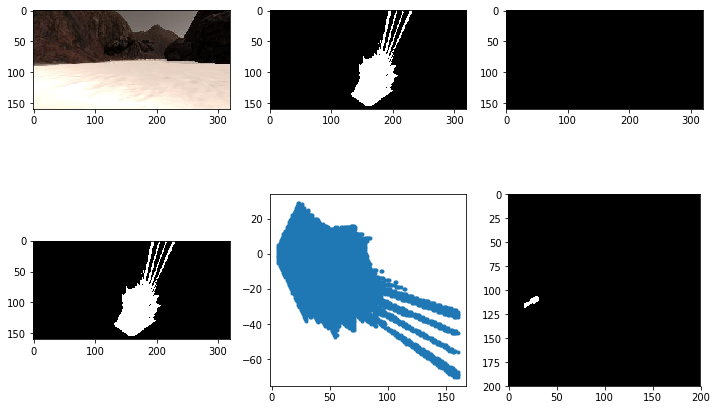

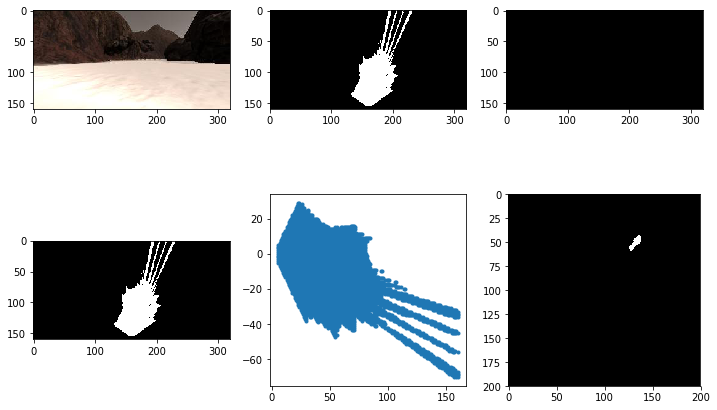

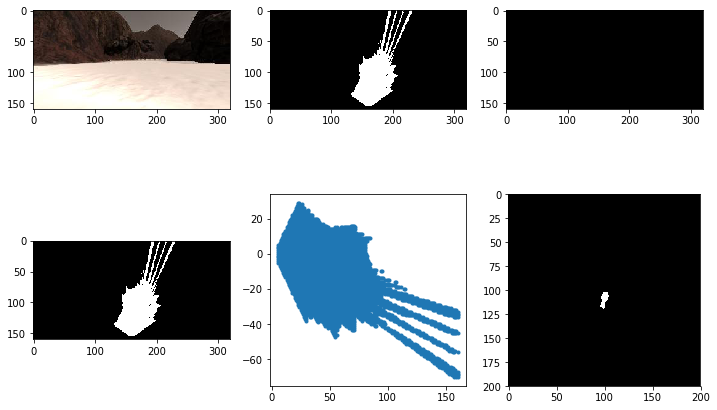

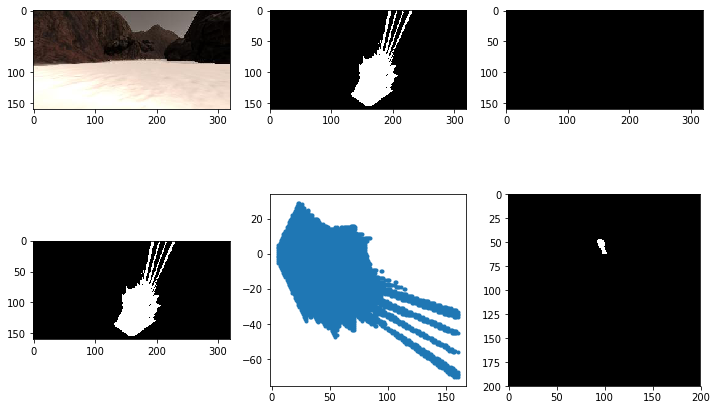

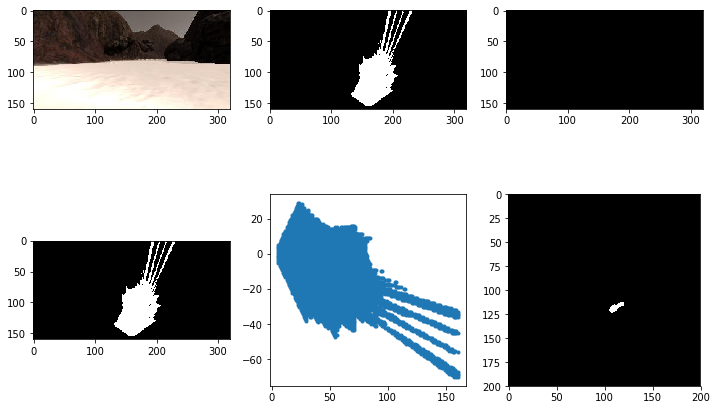

...

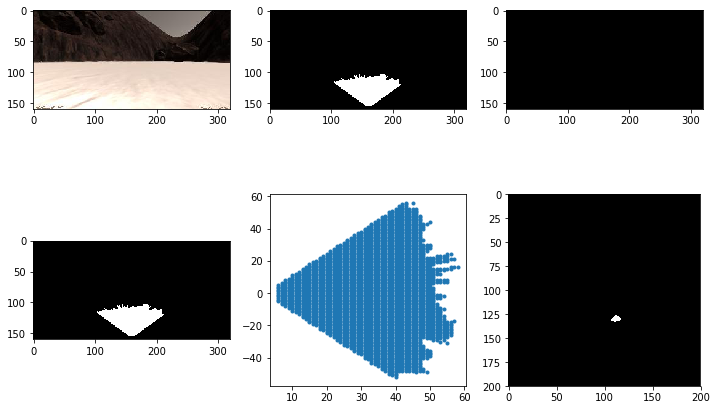

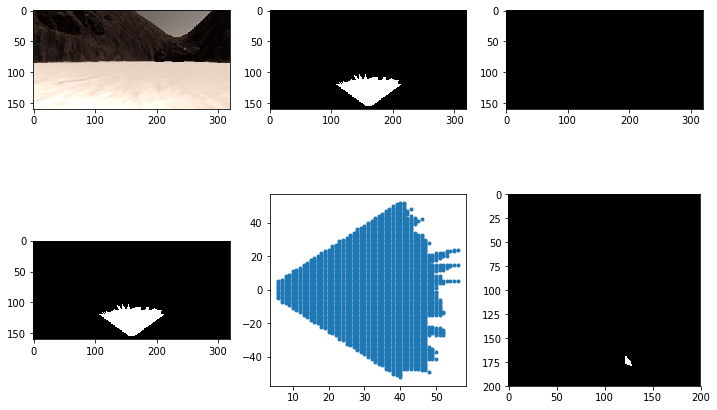

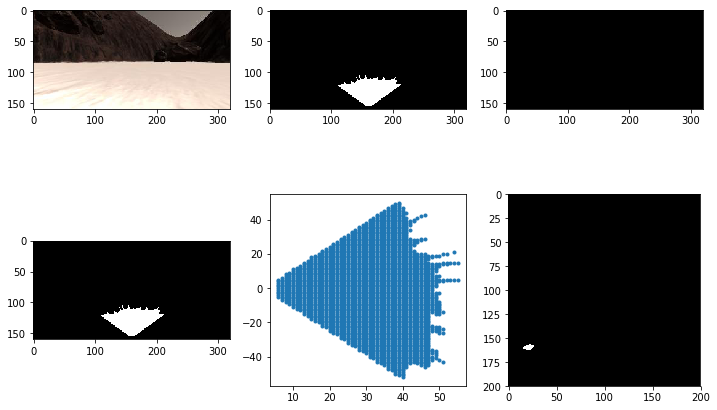

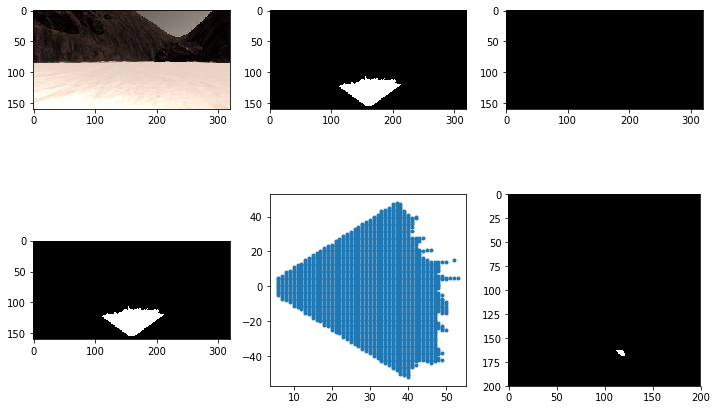

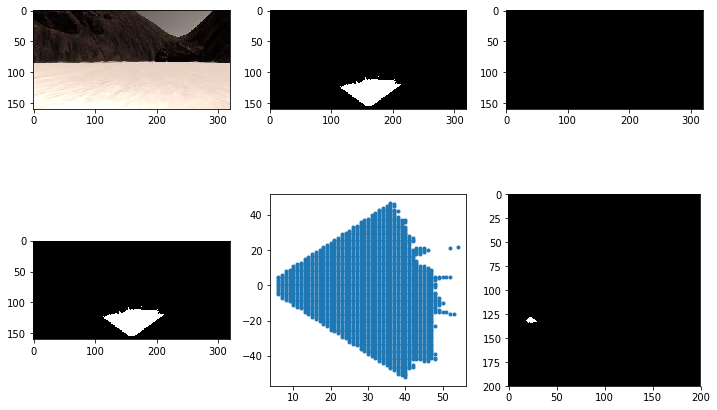

In [176]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from moviepy.editor import ImageSequenceClip


# Define pathname to save the output video
output = '../output/test_mapping.mp4'
data = Databucket() # Re-initialize data in case you're running this cell multiple times
clip = ImageSequenceClip(data.images, fps=60) # Note: output video will be sped up because 
                                          # recording rate in simulator is fps=25
new_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time new_clip.write_videofile(output, audio=False)

### This next cell should function as an inline video player
If this fails to render the video, try running the following cell (alternative video rendering method).  You can also simply have a look at the saved mp4 in your `/output` folder

In [12]:

from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

### Below is an alternative way to create a video in case the above cell did not work.

In [13]:
import io
import base64
video = io.open(output, 'r+b').read()
encoded_video = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded_video.decode('ascii')))